In [644]:
%load_ext autoreload
%autoreload 2
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import numpy
import sys
import scipy
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import math
import MDAnalysis
try:
    import voronoi_analysis_library
except ImportError:
    sys.path.append('/Users/treddy/github_projects/py_sphere_Voronoi') #for remote work on rMBP
    import voronoi_analysis_library

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


So, I can load many of the standard Python libraries above, but there will almost certainly be some dependency problems to resolve on hpslu with respect to my spherical Voronoi code.

In [3]:
import sys; sys.path.append('/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi')
import voronoi_utility
sys.path.append('/sansom/sc2/bioc1009/python_scripts/matplotlib_scripts')
import multicore_vesicle_virion_analysis

By installing the Anaconda Python distribution in a local directory on hpslu I seem to have resolved the library issues.

In [4]:
#start drafting IPython parallel workflow setup
from IPython.parallel import Client
rc = Client()

In [5]:
#make sure the engines are connected to the controller:
rc.ids

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

In [6]:
#so, have 10 cores available for work
#make sure each engine (each core) has the appropriate imports & magics for its namespace
dview = rc[:] #direct view to all engines
with dview.sync_imports(): #with PYTHONPATH appropriately adjusted BEFORE starting ipcluster
    import numpy
    import scipy
    import math
    import MDAnalysis 
    import voronoi_utility
    import multicore_vesicle_virion_analysis
    import voronoi_analysis_library

importing numpy on engine(s)
importing scipy on engine(s)
importing math on engine(s)
importing MDAnalysis on engine(s)
importing voronoi_utility on engine(s)
importing multicore_vesicle_virion_analysis on engine(s)
importing voronoi_analysis_library on engine(s)


In [853]:
%px %load_ext autoreload
%px %autoreload 2

[stdout:0] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:1] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:2] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:3] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:4] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:5] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:6] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:7] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:8] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[stdout:9] 
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
#assign appropriate remote engine(s) as needed:
engine_sim33 = rc[0]
engine_sim35 = rc[1]
engine_sim36 = rc[2]
engine_sim37 = rc[3]

In [9]:
#it will likely take quite a while to load the sim33 Universe object because of the files still on hfs0:
#try to load the sim33 universe object asynchronously on a remote engine (likewise for sim35--and eventually other replicates)
engine_sim33.execute("reload(voronoi_analysis_library)")
engine_sim35.execute("reload(voronoi_analysis_library)")
ar_sim33 = engine_sim33.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/',data_path_2='/sansom/n04/bioc1009/July2_2012_equil_vesicle_NO_Forss/',limit_1=99,limit_2=101,limit_3=-30,limit_4 =-28, coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/vesicle_build_adjusted_June19_2012/compact_neutral_antifreeze_nosolvent.gro', traj_data_extension='yes')")
ar_sim35 = engine_sim35.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Aug_20_2012_non_Forss_virion_prod_5us_rad_080_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")


In [681]:
engine_dengue['universe_object.trajectory.numframes']

5001

In [10]:
#try loading more replicates in parallel now (should be able to handle those that do not include FORS glycolipid):
engine_sim36.execute("reload(voronoi_analysis_library)")
engine_sim37.execute("reload(voronoi_analysis_library)")
ar_sim36 = engine_sim36.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Aug_21_2012_non_Forss_virion_prod_5us_rad_080_PULL_CODE/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/Aug_21_2012_non_Forss_virion_prod_5us_rad_080_PULL_CODE/',limit_3=-6,limit_4=-4)")
ar_sim37 = engine_sim37.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Nov_26_2012_non_Forss_virion_prod_5us_rad_080_unrestrained_323K/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")



In [11]:
#assign remote engines for sims38/39:
engine_sim38 = rc[4]
engine_sim39 = rc[5]

In [12]:
#load the universe objects into memory for sims38/39 on their respective engines:
engine_sim38.execute("reload(voronoi_analysis_library)")
engine_sim39.execute("reload(voronoi_analysis_library)")
ar_sim38 = engine_sim38.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Jan_11_2013_sim38_FORS_inclusive_295K_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/Forss_virion_by_conversion_Sept_2012/md_Lizzie_PR3_compact.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/Jan_11_2013_sim38_FORS_inclusive_295K_unrestrained/',limit_3=-6,limit_4=-4)")
ar_sim39 = engine_sim39.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/March_16_2013_sim39_FORS_inclusive_323K_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/Forss_virion_by_conversion_Sept_2012/md_Lizzie_PR3_compact.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/March_16_2013_sim39_FORS_inclusive_323K_unrestrained/',limit_3=-6,limit_4=-4)")

In [13]:
#assign a remote engine for dengue (sim126 extended)
engine_dengue = rc[6]

In [14]:
#load the skip-10 processed dengue trajectory (5-10 microseconds at 323 K; verify ~5000 frames after loading) on the remote IPython engine
engine_dengue.execute("reload(voronoi_analysis_library)")
ar_dengue = engine_dengue.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine_dengue('/sansom/n22/bioc1009/sim126_extended/sim126_insect_dengue_323K_extended.part0026.gro')") #the sim126 extended trajectory file list is generated inside the function

In [77]:
#start testing production and loading of control xtc files:
engine_control_1 = rc[7]
engine_control_2 = rc[8]

In [61]:
#use one of the control engines to generate (write to disk) both control xtc files:
engine_control_1.execute("reload(voronoi_analysis_library)")
ar_generate_controls = engine_control_1.execute("voronoi_analysis_library.create_control_universe_data('/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")

In [256]:
#likewise, use one of the control engines to generate (write to disk) both control .gro files:
engine_control_1.execute("reload(voronoi_analysis_library)")
ar_generate_control_coords = engine_control_1.execute("voronoi_analysis_library.create_control_universe_coord_data('/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")

In [78]:
#load the first control trajectory into a universe object on a remote IPython engine
ar_load_control_1 = engine_control_1.execute("universe_object = MDAnalysis.Universe('/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_1.gro','/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_1.xtc')")

In [79]:
#and now load the second control trajectory into a universe object on a remote IPython engine
ar_load_control_2 = engine_control_2.execute("universe_object = MDAnalysis.Universe('/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_2.gro','/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_2.xtc')")

In [44]:
#debug: load control 2 universe object in main IPython engine--going to see if I'm missing any error messages in the Voronoi workflow simply because I'm working in parallel
universe_object = MDAnalysis.Universe('/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_2.gro','/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_2.xtc')

In [166]:
#check to see if universe objects have been loaded asychronously on their respective IPython engines (cores):
[ar.ready() for ar in [ar_sim33,ar_sim35,ar_sim36,ar_sim37,ar_sim38,ar_sim39,ar_dengue]]

[True, True, True, True, True, True, True]

In [27]:
ar_dengue_frame_count = engine_dengue.execute("numframes = universe_object.trajectory.numframes")

In [33]:
engine_dengue['numframes'] #~5000 is very reasonable for the skip-10 processed trajectory

5001

In [36]:
(ar_sim38.ready(),ar_sim39.ready(),ar_sim33.ready(),ar_sim35.ready(),ar_sim36.ready(),ar_sim37.ready(),ar_dengue.ready(),ar_load_control_1.ready(),ar_load_control_2.ready())


(True, True, True, True, True, True, True, True, True)

In [472]:
#check that the number of frames loaded for sims36 & 37 is reasonable
ar3 = engine_sim36.execute('numframes = universe_object.trajectory.numframes')
ar4 = engine_sim37.execute('numframes = universe_object.trajectory.numframes')

In [547]:
#check that the number of frames loaded for sims38 & 39 is reasonable
ar3 = engine_sim38.execute('numframes = universe_object.trajectory.numframes')
ar4 = engine_sim39.execute('numframes = universe_object.trajectory.numframes')


In [476]:
engine_sim36['numframes'],engine_sim37['numframes']

(40381, 49089)

In [557]:
engine_sim38['numframes'],engine_sim39['numframes']


(49505, 50013)

Those are reasonable frame numbers for sims36/37, so they may be correctly loaded on 2 more engines (cores).

In [364]:
#check the results of loading sim33/35/etc. universe objects on their respective engines (won't be able to access universe object directly because it can't be pickled):
ar1 = engine_sim35.execute('numframes = universe_object.trajectory.numframes')
ar2 = engine_sim33.execute('numframes = universe_object.trajectory.numframes')

In [366]:
(engine_sim33['numframes'],engine_sim35['numframes'])

(48956, 49446)

So, finally have confirmation of reasonable frame numbers for sim33/35 universe objects loading in parallel on two different IPython engines (cores). Will eventually want to expand this workflow to include more replicates.

In [645]:
#test newly-abstracted precursor code for radial distance assessment on sims33/35 in parallel initially
engine_sim33.execute("reload(voronoi_analysis_library)")
engine_sim35.execute("reload(voronoi_analysis_library)")
precursor_ar_sim33 = engine_sim33.execute("list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim35 = engine_sim35.execute("sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")

In [646]:
#perform precursor radial distance analysis for first control universe
engine_control_1.execute("reload(voronoi_analysis_library)")
precursor_ar_control_1 = engine_control_1.execute("control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None,control_condition=1)")


In [647]:
#perform precursor radial distance analysis for second control universe
engine_control_2.execute("reload(voronoi_analysis_library)")
precursor_ar_control_2 = engine_control_2.execute("control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None,control_condition=1)")


In [648]:
#now expand the testing of abstracted precursor code to include the remaing flu simulations (sims 36,37,38,39)
engine_sim36.execute("reload(voronoi_analysis_library)")
engine_sim37.execute("reload(voronoi_analysis_library)")
engine_sim38.execute("reload(voronoi_analysis_library)")
engine_sim39.execute("reload(voronoi_analysis_library)")
precursor_ar_sim36 = engine_sim36.execute("sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim37 = engine_sim37.execute("sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim38 = engine_sim38.execute("sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_frame_numbers,sim38_list_FORS_percent_above_treshold,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=1)")
precursor_ar_sim39 = engine_sim39.execute("sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_frame_numbers,sim39_list_FORS_percent_above_treshold,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=1)")

In [649]:
#start testing precursor radial distance assessment code for dengue simulation:
engine_dengue.execute("reload(voronoi_analysis_library)")
precursor_ar_dengue = engine_dengue.execute("list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,list_frame_numbers,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_dengue_lipid_headgroup_midpoint_distances,list_min_protein_distances,list_max_protein_distances = voronoi_analysis_library.precursor_radial_distance_analysis_dengue(universe_object)")

In [656]:
(precursor_ar_control_1.ready(),precursor_ar_sim33.ready(),precursor_ar_sim35.ready(),precursor_ar_sim36.ready(),precursor_ar_sim37.ready(),precursor_ar_sim38.ready(),precursor_ar_sim39.ready(),precursor_ar_dengue.ready(),precursor_ar_control_2.ready())

(True, True, True, True, True, True, True, True, True)

In [657]:
#now pull the precursor radial distance assessment data back from the engines so I can plot locally below
list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold = [engine_sim33[key] for key in ['list_min_PPCH_PO4_distances','list_max_PPCH_PO4_distances','list_average_PPCH_PO4_distances','list_std_dev_PPCH_PO4_distances','list_frame_numbers','list_PPCH_percent_above_treshold','list_min_CHOL_ROH_distances','list_max_CHOL_ROH_distances','list_average_CHOL_ROH_distances','list_std_dev_CHOL_ROH_distances','list_CHOL_ROH_midpoint_distances','list_CHOL_ROH_percent_above_threshold','list_CHOL_ROH_percent_below_threshold','list_min_remaining_headgroup_distances','list_max_remaining_headgroup_distances','list_average_remaining_headgroup_distances','list_std_dev_remaining_headgroup_distances','list_remaining_headgroup_midpoint_distances','list_remaining_headgroup_percent_above_threshold','list_remaining_headgroup_percent_below_threshold','threshold']]
sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold = [engine_sim35[key] for key in ['sim35_list_min_PPCH_PO4_distances','sim35_list_max_PPCH_PO4_distances','sim35_list_average_PPCH_PO4_distances','sim35_list_std_dev_PPCH_PO4_distances','sim35_list_frame_numbers','sim35_list_PPCH_percent_above_treshold','sim35_list_min_CHOL_ROH_distances','sim35_list_max_CHOL_ROH_distances','sim35_list_average_CHOL_ROH_distances','sim35_list_std_dev_CHOL_ROH_distances','sim35_list_CHOL_ROH_midpoint_distances','sim35_list_CHOL_ROH_percent_above_threshold','sim35_list_CHOL_ROH_percent_below_threshold','sim35_list_min_remaining_headgroup_distances','sim35_list_max_remaining_headgroup_distances','sim35_list_average_remaining_headgroup_distances','sim35_list_std_dev_remaining_headgroup_distances','sim35_list_remaining_headgroup_midpoint_distances','sim35_list_remaining_headgroup_percent_above_threshold','sim35_list_remaining_headgroup_percent_below_threshold','sim35_threshold']]
sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold = [engine_sim36[key] for key in ['sim36_list_min_PPCH_PO4_distances','sim36_list_max_PPCH_PO4_distances','sim36_list_average_PPCH_PO4_distances','sim36_list_std_dev_PPCH_PO4_distances','sim36_list_frame_numbers','sim36_list_PPCH_percent_above_treshold','sim36_list_min_CHOL_ROH_distances','sim36_list_max_CHOL_ROH_distances','sim36_list_average_CHOL_ROH_distances','sim36_list_std_dev_CHOL_ROH_distances','sim36_list_CHOL_ROH_midpoint_distances','sim36_list_CHOL_ROH_percent_above_threshold','sim36_list_CHOL_ROH_percent_below_threshold','sim36_list_min_remaining_headgroup_distances','sim36_list_max_remaining_headgroup_distances','sim36_list_average_remaining_headgroup_distances','sim36_list_std_dev_remaining_headgroup_distances','sim36_list_remaining_headgroup_midpoint_distances','sim36_list_remaining_headgroup_percent_above_threshold','sim36_list_remaining_headgroup_percent_below_threshold','sim36_threshold']]
sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold = [engine_sim37[key] for key in ['sim37_list_min_PPCH_PO4_distances','sim37_list_max_PPCH_PO4_distances','sim37_list_average_PPCH_PO4_distances','sim37_list_std_dev_PPCH_PO4_distances','sim37_list_frame_numbers','sim37_list_PPCH_percent_above_treshold','sim37_list_min_CHOL_ROH_distances','sim37_list_max_CHOL_ROH_distances','sim37_list_average_CHOL_ROH_distances','sim37_list_std_dev_CHOL_ROH_distances','sim37_list_CHOL_ROH_midpoint_distances','sim37_list_CHOL_ROH_percent_above_threshold','sim37_list_CHOL_ROH_percent_below_threshold','sim37_list_min_remaining_headgroup_distances','sim37_list_max_remaining_headgroup_distances','sim37_list_average_remaining_headgroup_distances','sim37_list_std_dev_remaining_headgroup_distances','sim37_list_remaining_headgroup_midpoint_distances','sim37_list_remaining_headgroup_percent_above_threshold','sim37_list_remaining_headgroup_percent_below_threshold','sim37_threshold']]
sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_frame_numbers,sim38_list_FORS_percent_above_treshold,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold = [engine_sim38[key] for key in ['sim38_list_min_FORS_AM2_distances','sim38_list_max_FORS_AM2_distances','sim38_list_average_FORS_AM2_distances','sim38_list_std_dev_FORS_AM2_distances','sim38_list_frame_numbers','sim38_list_FORS_percent_above_treshold','sim38_list_min_PPCH_PO4_distances','sim38_list_max_PPCH_PO4_distances','sim38_list_average_PPCH_PO4_distances','sim38_list_std_dev_PPCH_PO4_distances','sim38_list_PPCH_percent_above_treshold','sim38_list_min_CHOL_ROH_distances','sim38_list_max_CHOL_ROH_distances','sim38_list_average_CHOL_ROH_distances','sim38_list_std_dev_CHOL_ROH_distances','sim38_list_CHOL_ROH_midpoint_distances','sim38_list_CHOL_ROH_percent_above_threshold','sim38_list_CHOL_ROH_percent_below_threshold','sim38_list_min_remaining_headgroup_distances','sim38_list_max_remaining_headgroup_distances','sim38_list_average_remaining_headgroup_distances','sim38_list_std_dev_remaining_headgroup_distances','sim38_list_remaining_headgroup_midpoint_distances','sim38_list_remaining_headgroup_percent_above_threshold','sim38_list_remaining_headgroup_percent_below_threshold','sim38_threshold']]
sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_frame_numbers,sim39_list_FORS_percent_above_treshold,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold = [engine_sim39[key] for key in ['sim39_list_min_FORS_AM2_distances','sim39_list_max_FORS_AM2_distances','sim39_list_average_FORS_AM2_distances','sim39_list_std_dev_FORS_AM2_distances','sim39_list_frame_numbers','sim39_list_FORS_percent_above_treshold','sim39_list_min_PPCH_PO4_distances','sim39_list_max_PPCH_PO4_distances','sim39_list_average_PPCH_PO4_distances','sim39_list_std_dev_PPCH_PO4_distances','sim39_list_PPCH_percent_above_treshold','sim39_list_min_CHOL_ROH_distances','sim39_list_max_CHOL_ROH_distances','sim39_list_average_CHOL_ROH_distances','sim39_list_std_dev_CHOL_ROH_distances','sim39_list_CHOL_ROH_midpoint_distances','sim39_list_CHOL_ROH_percent_above_threshold','sim39_list_CHOL_ROH_percent_below_threshold','sim39_list_min_remaining_headgroup_distances','sim39_list_max_remaining_headgroup_distances','sim39_list_average_remaining_headgroup_distances','sim39_list_std_dev_remaining_headgroup_distances','sim39_list_remaining_headgroup_midpoint_distances','sim39_list_remaining_headgroup_percent_above_threshold','sim39_list_remaining_headgroup_percent_below_threshold','sim39_threshold']]


In [658]:
#likewise, pull the precursor dengue radial distance assessment data back from the remote engine:
list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,dengue_list_frame_numbers,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_dengue_lipid_headgroup_midpoint_distances,list_min_protein_distances,list_max_protein_distances = [engine_dengue[key] for key in ['list_min_dengue_lipid_headgroup_distances','list_max_dengue_lipid_headgroup_distances','list_average_dengue_lipid_headgroup_distances','list_std_dev_dengue_lipid_headgroup_distances','list_frame_numbers','list_dengue_lipid_headgroup_percent_above_threshold','list_dengue_lipid_headgroup_percent_below_threshold','list_dengue_lipid_headgroup_midpoint_distances','list_min_protein_distances','list_max_protein_distances']]


In [659]:
#likewise, pull the precursor control #1 radial distance assessment data back from the remote engine:
control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold = [engine_control_1[key] for key in ['control_1_list_min_PPCH_PO4_distances','control_1_list_max_PPCH_PO4_distances','control_1_list_average_PPCH_PO4_distances','control_1_list_std_dev_PPCH_PO4_distances','control_1_list_frame_numbers','control_1_list_PPCH_percent_above_treshold','control_1_list_min_CHOL_ROH_distances','control_1_list_max_CHOL_ROH_distances','control_1_list_average_CHOL_ROH_distances','control_1_list_std_dev_CHOL_ROH_distances','control_1_list_CHOL_ROH_midpoint_distances','control_1_list_CHOL_ROH_percent_above_threshold','control_1_list_CHOL_ROH_percent_below_threshold','control_1_list_min_remaining_headgroup_distances','control_1_list_max_remaining_headgroup_distances','control_1_list_average_remaining_headgroup_distances','control_1_list_std_dev_remaining_headgroup_distances','control_1_list_remaining_headgroup_midpoint_distances','control_1_list_remaining_headgroup_percent_above_threshold','control_1_list_remaining_headgroup_percent_below_threshold','control_1_threshold']]


In [660]:
#likewise, pull the precursor control #2 radial distance assessment data back from the remote engine:
control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold = [engine_control_2[key] for key in ['control_2_list_min_PPCH_PO4_distances','control_2_list_max_PPCH_PO4_distances','control_2_list_average_PPCH_PO4_distances','control_2_list_std_dev_PPCH_PO4_distances','control_2_list_frame_numbers','control_2_list_PPCH_percent_above_treshold','control_2_list_min_CHOL_ROH_distances','control_2_list_max_CHOL_ROH_distances','control_2_list_average_CHOL_ROH_distances','control_2_list_std_dev_CHOL_ROH_distances','control_2_list_CHOL_ROH_midpoint_distances','control_2_list_CHOL_ROH_percent_above_threshold','control_2_list_CHOL_ROH_percent_below_threshold','control_2_list_min_remaining_headgroup_distances','control_2_list_max_remaining_headgroup_distances','control_2_list_average_remaining_headgroup_distances','control_2_list_std_dev_remaining_headgroup_distances','control_2_list_remaining_headgroup_midpoint_distances','control_2_list_remaining_headgroup_percent_above_threshold','control_2_list_remaining_headgroup_percent_below_threshold','control_2_threshold']]


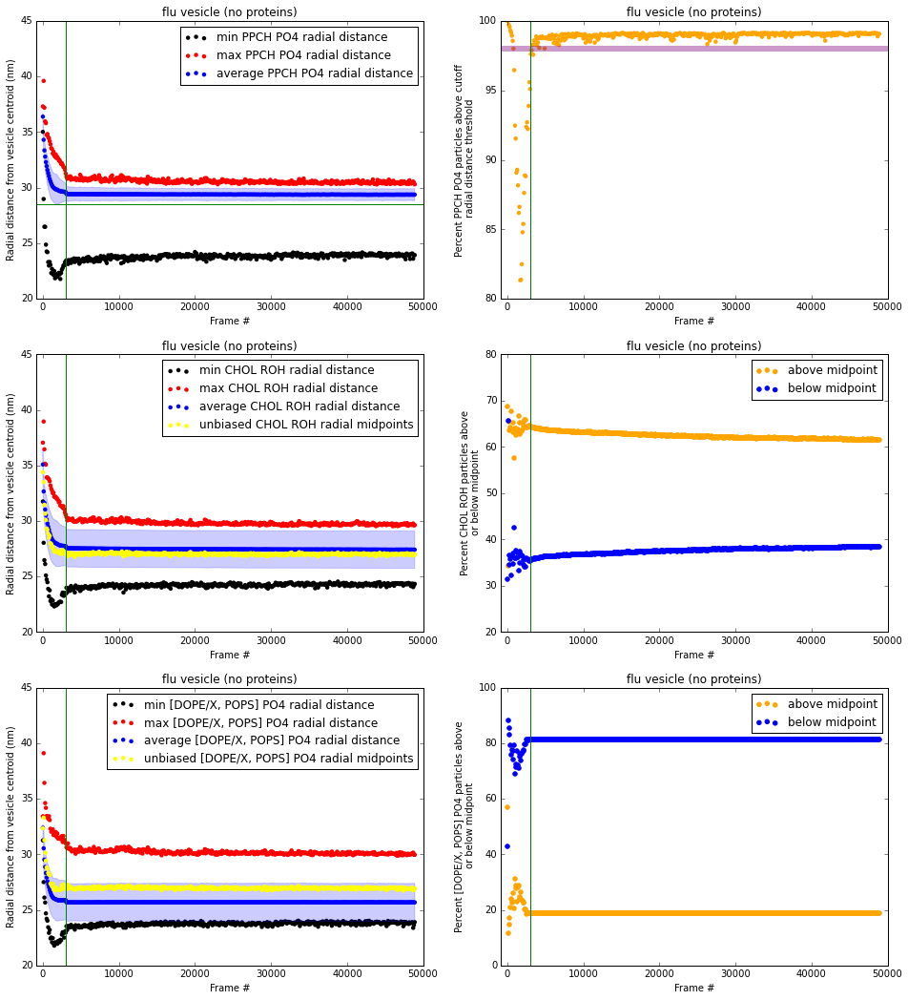

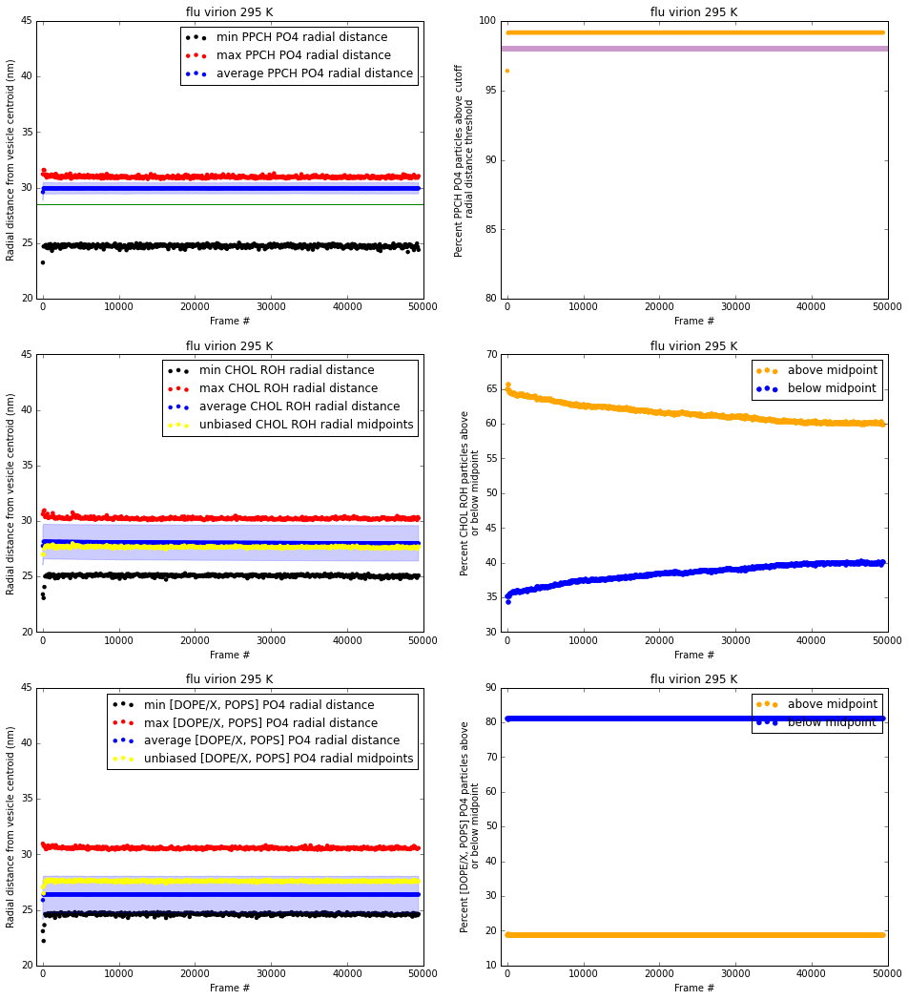

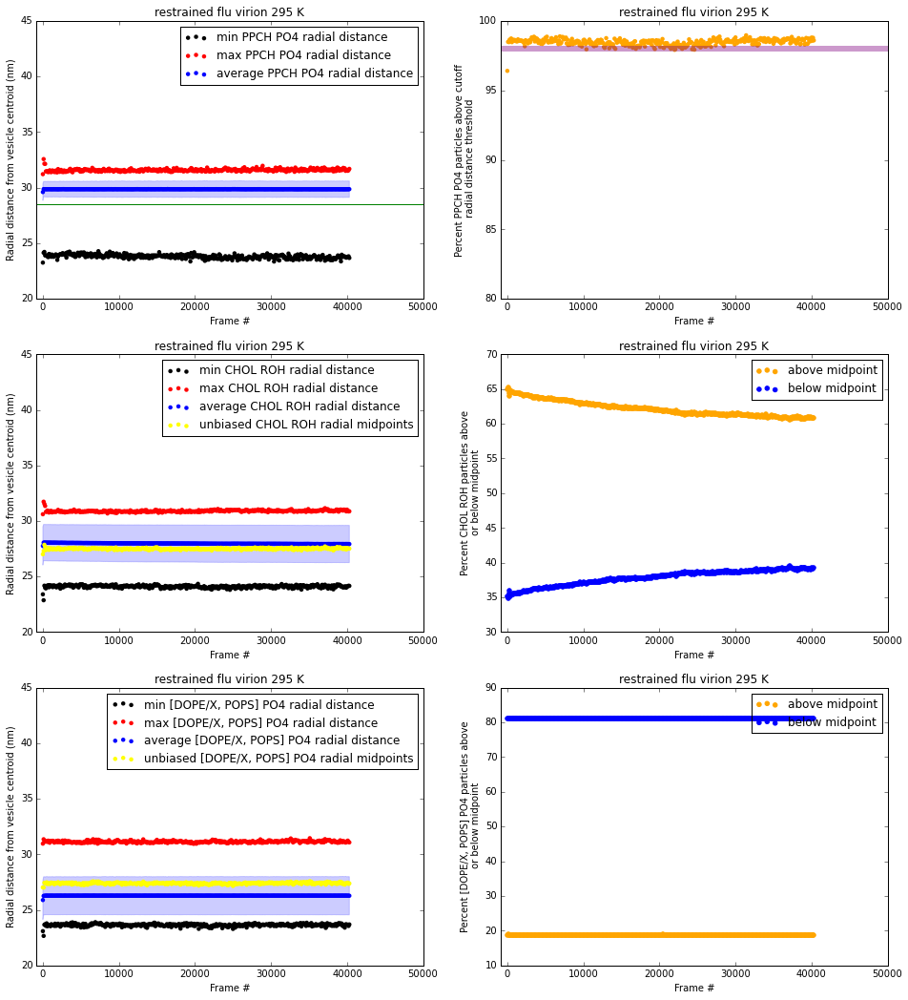

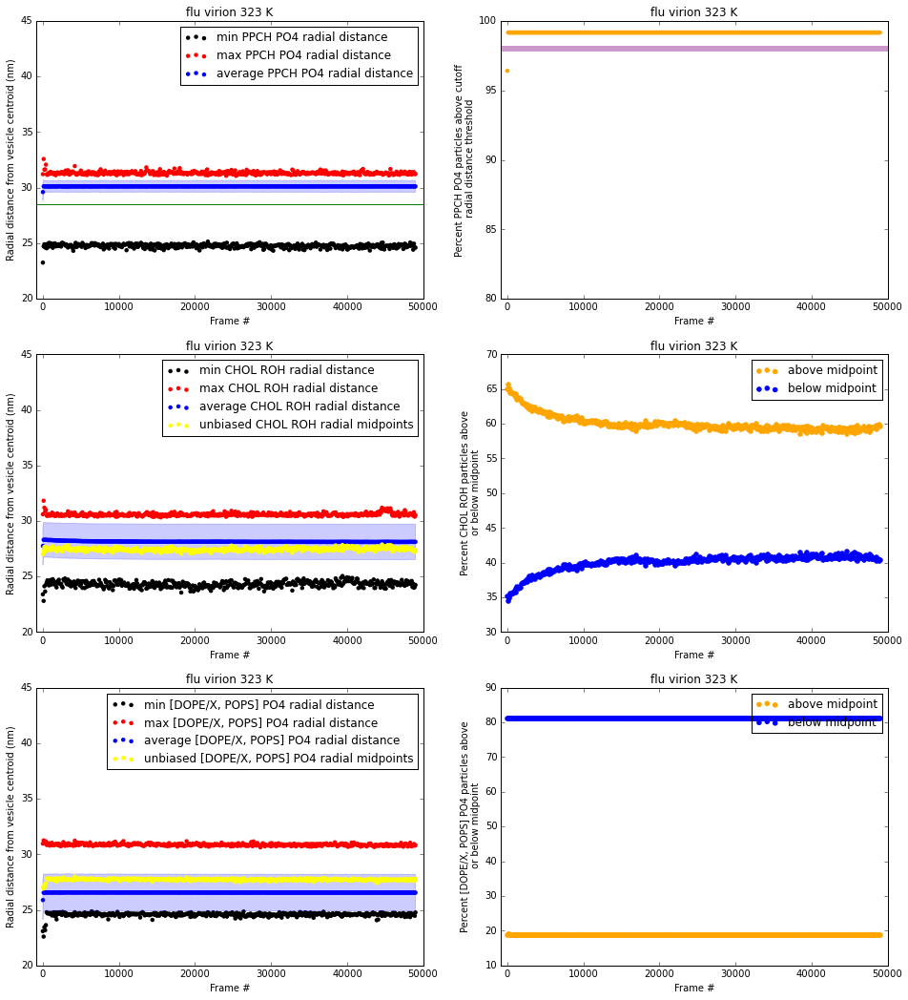

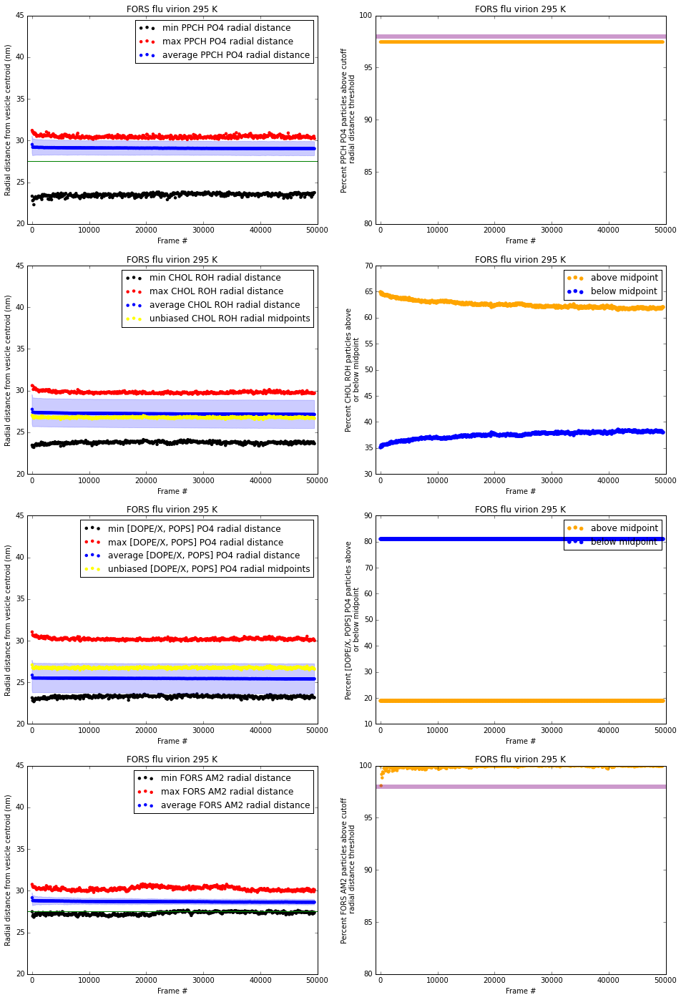

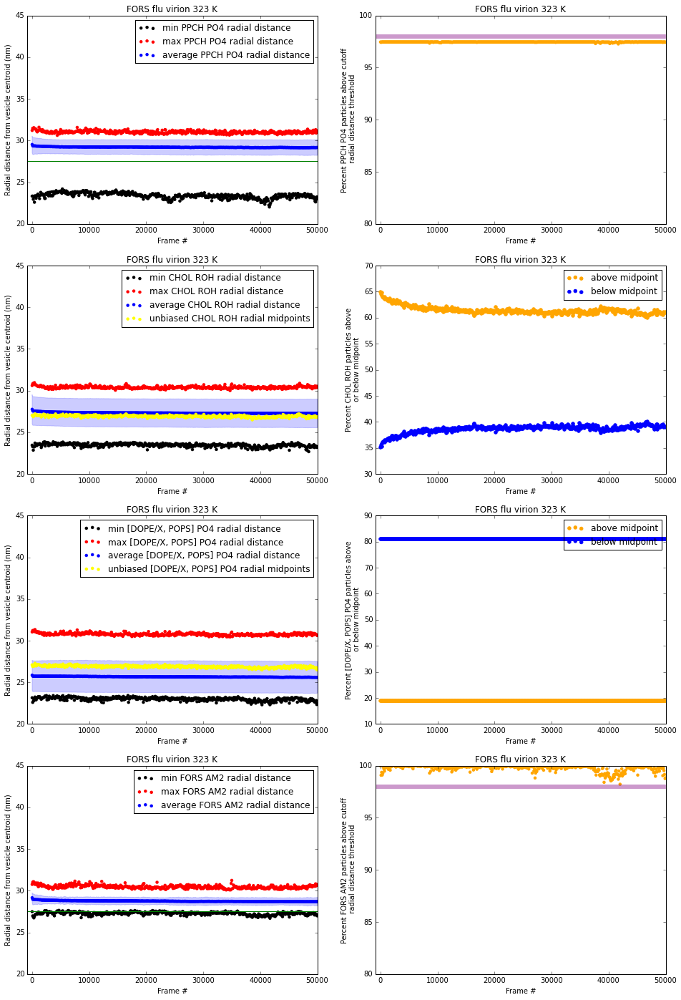

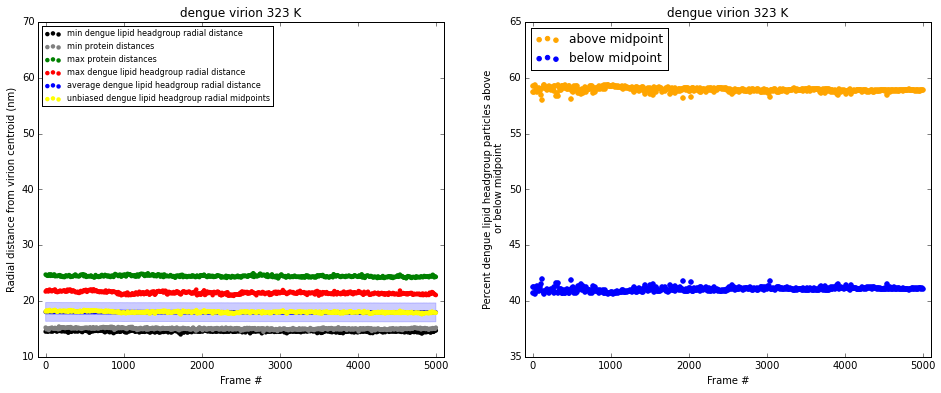

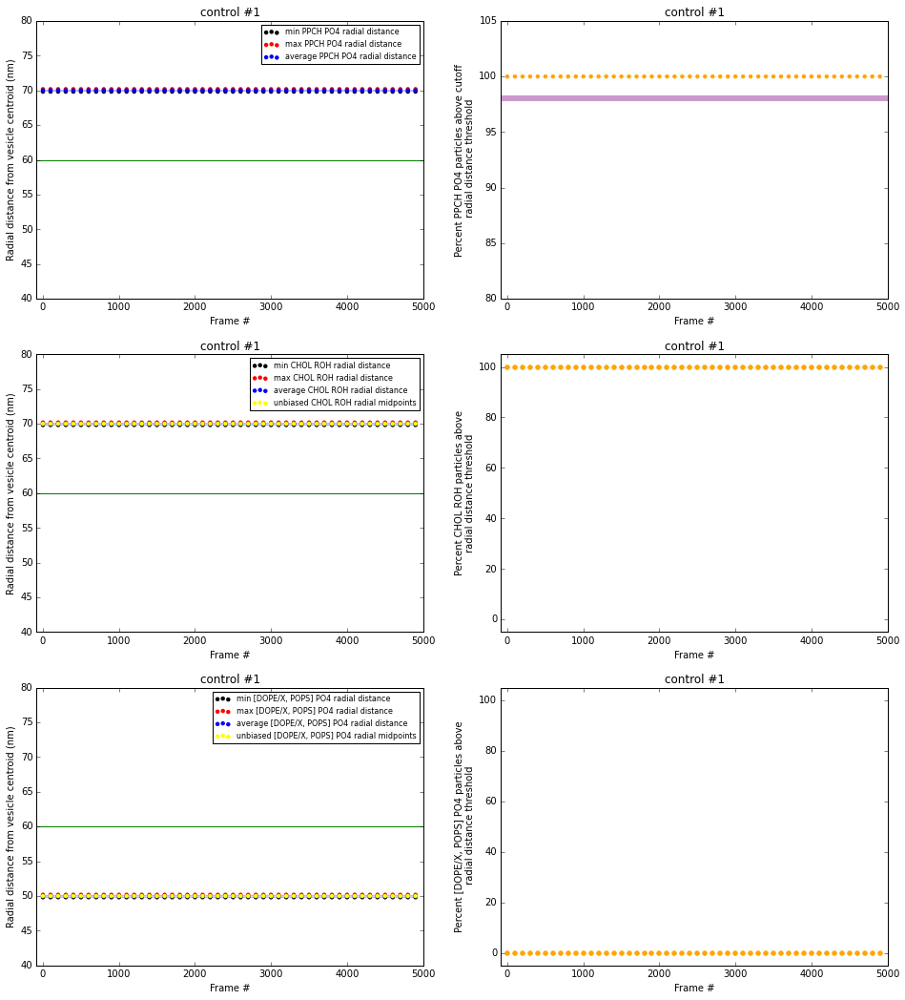

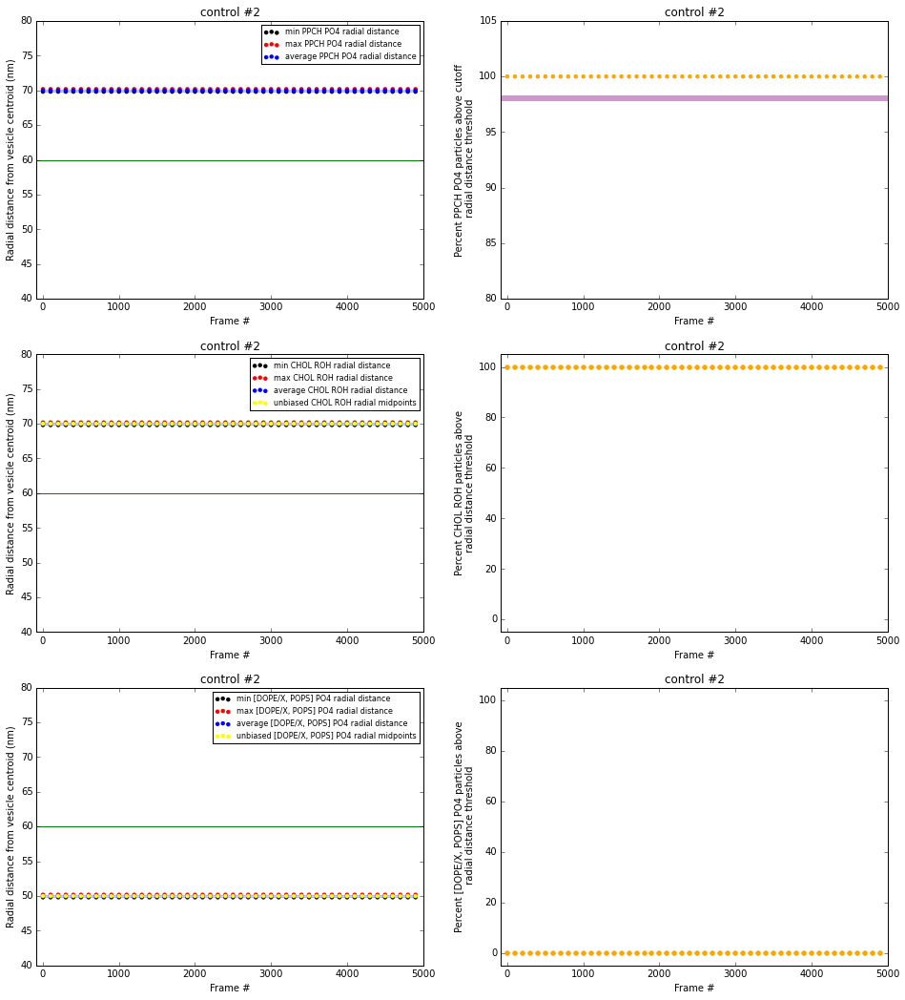

In [661]:
import voronoi_analysis_library
#plot the testing data produced above:
fig_sim33 = plt.figure()
sim33_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim33,list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold)
sim33_radial_assessment_instance.plot('flu vesicle (no proteins)',equil_line=1)
#test plot for sim35:
fig_sim35 = plt.figure()
sim35_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim35,sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold)
sim35_radial_assessment_instance.plot('flu virion 295 K')
#test plot for sim36:
fig_sim36 = plt.figure()
sim36_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim36,sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold)
sim36_radial_assessment_instance.plot('restrained flu virion 295 K')
#test plot for sim37:
fig_sim37 = plt.figure()
sim37_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim37,sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold)
sim37_radial_assessment_instance.plot('flu virion 323 K')
#test plot for sim38:
fig_sim38 = plt.figure()
sim38_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim38,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_frame_numbers,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold,sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_FORS_percent_above_treshold,FORS_present=1)
sim38_radial_assessment_instance.plot('FORS flu virion 295 K')
#test plot for sim39:
fig_sim39 = plt.figure()
sim39_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim39,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_frame_numbers,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold,sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_FORS_percent_above_treshold,FORS_present=1)
sim39_radial_assessment_instance.plot('FORS flu virion 323 K')
#test plot for dengue:
fig_dengue = plt.figure()
dengue_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment_dengue(fig_dengue,dengue_list_frame_numbers,list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,list_dengue_lipid_headgroup_midpoint_distances,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_min_protein_distances,list_max_protein_distances)
dengue_radial_assessment_instance.plot('dengue virion 323 K')
#test plot for control #1:
fig_control_1 = plt.figure()
control_1_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_control_1,control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold,control_condition=1)
control_1_radial_assessment_instance.plot('control #1')
#test plot for control #2:
fig_control_2 = plt.figure()
control_2_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_control_2,control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold,control_condition=1)
control_2_radial_assessment_instance.plot('control #2')

In [796]:
#try to create a simple dengue trajectory movie to assess the proposed presence of 'floater' lipids outside the virion proper (causing the radial distance spikes observed above)
engine_dengue.execute("reload(voronoi_analysis_library)")
ar_dengue_movie = engine_dengue.execute("voronoi_analysis_library.create_dengue_trajectory_movie(universe_object)")

In [820]:
ar_dengue_movie.ready() #seems to take quite a while to produce the movie

True

In [821]:
ar_dengue_movie.get()

In [108]:
#display the dengue movie produced above as an HTML5 video below:
from IPython.display import HTML
HTML("""<video controls> <source src="./dengue_assess_lipid_headgroups.mp4" type="video/mp4"> </video>""")

Clearly, we can capture > 98 % of the PPCH PO4 particles by requiring that radial distance exceeds 28.5 nm (just outside 1 standard deviation from the average for PPCH PO4). This isn't surprising given that PPCH was initially placed entirely in the outer leaflet and only a small amount of PPCH flipped to inner leaflet during equilibration. So, one thing we might want to do for the outer leaflet is project all headgroup particles to the average of PPCH PO4. For PPCH PO4, this would mean taking all particles > 28.5 nm and projecting to the average value (to avoid projecting inner leaflet outliers).

For CHOL ROH particles I think it is most sensible to use the unbiased midpoint of the max and min radial distances in a given frame as the threshold for determination of leaflet assignment. So, if a CHOL ROH particle falls above the midpoint threshold in a given frame, it should be projected up to the PPCH PO4 average radial distance (and check that there are no steric conflicts after projection).

For the minor outer leaflet species (POPS, DOPX, DOPE) it also seems sensible to use an unbiased midpoint cutoff. In a given frame PO4 particles would then be projected up or down to the average value of the appropriate leaflet. My current focus is the outer leaflet where we would probably aim to project everything up to the PPCH PO4 average radial distance (again, need to check for steric conflicts after projection).

I've now expanded this analysis to include the flu virion at 295 K, and the results look quite similar--I think it may be possible to use similar leaflet assignment and projection criteria.

In [886]:
#import time
#start_time = time.time()
#%%prun -T bench.txt
#testing abstraction / generalization of above large Voronoi analysis loop code:
#now testing asychronous parallel workflow for sims33/35
engine_sim33.execute('reload(voronoi_analysis_library)')
engine_sim33.execute('reload(voronoi_utility)')
engine_sim33.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_sim33.execute('import circumcircle')
engine_sim33.execute('reload(circumcircle)')
ar_sim33 = engine_sim33.execute("sim33_list_frame_numbers_stage_2,sim33_list_percent_surface_area_reconstitution,sim33_list_percent_surface_area_reconstitution_inner_leaflet,sim33_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,3000,'full',1000,PPCH_PO4_threshold=285,proteins_present='no')")
#block until both results are ready (for proper benchmark,etc.)
#dview.wait([ar_sim35,ar_sim33])
#end_time = time.time()
#print 'execution time (seconds):', end_time - start_time

In [887]:
engine_sim35.execute('reload(voronoi_analysis_library)')
engine_sim35.execute('reload(voronoi_utility)')
engine_sim35.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_sim35.execute('import circumcircle')
engine_sim35.execute('reload(circumcircle)')
ar_sim35 = engine_sim35.execute("sim35_list_frame_numbers_stage_2,sim35_list_percent_surface_area_reconstitution_from_lipids_only,sim35_list_percent_surface_area_reconstitution_from_proteins_only,sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim35_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")


In [888]:
#test area per molecule analysis on control condition #1:
engine_control_1.execute("reload(voronoi_analysis_library)")
engine_control_1.execute("reload(voronoi_utility)")
engine_control_1.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_control_1.execute('import circumcircle')
engine_control_1.execute('reload(circumcircle)')
ar_control_1 = engine_control_1.execute("control_1_list_frame_numbers_stage_2,control_1_list_percent_surface_area_reconstitution,control_1_list_percent_surface_area_reconstitution_inner_leaflet,control_1_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,control_condition=1)") #stage 2 specifier to avoid namespace conflict with precursor analysis


In [889]:
#test area per molecule analysis on control condition #2:
engine_control_2.execute("reload(voronoi_analysis_library)")
engine_control_2.execute("reload(voronoi_utility)")
engine_control_2.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_control_2.execute('import circumcircle')
engine_control_2.execute('reload(circumcircle)')
ar_control_2 = engine_control_2.execute("control_2_list_frame_numbers_stage_2,control_2_list_percent_surface_area_reconstitution,control_2_list_percent_surface_area_reconstitution_inner_leaflet,control_2_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,control_condition=1)") #stage 2 specifier to avoid namespace conflict with precursor analysis


In [890]:
#expand area per molecule analysis to include sims 36/37 by performing asynchronous parallel calculation on their respective engines:
engine_sim36.execute('reload(voronoi_analysis_library)')
engine_sim36.execute('reload(voronoi_utility)')
engine_sim36.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_sim36.execute('import circumcircle')
engine_sim36.execute('reload(circumcircle)')
engine_sim37.execute('reload(voronoi_analysis_library)')
engine_sim37.execute('reload(voronoi_utility)')
engine_sim37.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_sim37.execute('import circumcircle')
engine_sim37.execute('reload(circumcircle)')
ar_sim36 = engine_sim36.execute("sim36_list_frame_numbers_stage_2,sim36_list_percent_surface_area_reconstitution_from_lipids_only,sim36_list_percent_surface_area_reconstitution_from_proteins_only,sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim36_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")
ar_sim37 = engine_sim37.execute("sim37_list_frame_numbers_stage_2,sim37_list_percent_surface_area_reconstitution_from_lipids_only,sim37_list_percent_surface_area_reconstitution_from_proteins_only,sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim37_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")



In [891]:
#expand area per molecule analysis to include sims38/39 once voronoi_analysis_library.voronoi_analysis_loop() function has been expanded to work properly with FORS residues
engine_sim38.execute('reload(voronoi_analysis_library)')
engine_sim38.execute('reload(voronoi_utility)')
engine_sim38.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_sim38.execute('import circumcircle')
engine_sim38.execute('reload(circumcircle)')
engine_sim39.execute('reload(voronoi_analysis_library)')
engine_sim39.execute('reload(voronoi_utility)')
engine_sim39.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_sim39.execute('import circumcircle')
engine_sim39.execute('reload(circumcircle)')
#currently just testing the new FORS-adjusted code (expecting at least one or two problems):
ar_sim38 = engine_sim38.execute("sim38_list_frame_numbers_stage_2,sim38_list_percent_surface_area_reconstitution_from_lipids_only,sim38_list_percent_surface_area_reconstitution_from_proteins_only,sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim38_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=275,proteins_present='yes',FORS_present='yes')")
ar_sim39 = engine_sim39.execute("sim39_list_frame_numbers_stage_2,sim39_list_percent_surface_area_reconstitution_from_lipids_only,sim39_list_percent_surface_area_reconstitution_from_proteins_only,sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim39_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=275,proteins_present='yes',FORS_present='yes')")


In [892]:
#now expand area per molecule analysis to include the dengue trajectory (testing phase)
engine_dengue.execute('reload(voronoi_analysis_library)')
engine_dengue.execute('reload(voronoi_utility)')
engine_dengue.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_dengue.execute('import circumcircle')
engine_dengue.execute('reload(circumcircle)')
ar_dengue = engine_dengue.execute("dengue_list_frame_numbers_stage_2,dengue_list_percent_surface_area_reconstitution_from_lipids_only,dengue_list_percent_surface_area_reconstitution_from_proteins_only,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,proteins_present='yes',dengue_condition=1)")

In [901]:
(ar_sim33.ready(),ar_sim35.ready(),ar_sim36.ready(),ar_sim37.ready(),ar_sim38.ready(),ar_sim39.ready(),ar_control_1.ready(),ar_control_2.ready(),ar_dengue.ready())

(True, True, True, True, True, True, True, True, True)

In [910]:
ar_dengue.get()

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

In [911]:
#pull out the Voronoi data parsed on various IPython engines (other cores):
sim35_list_frame_numbers_stage_2,sim35_list_percent_surface_area_reconstitution_from_lipids_only,sim35_list_percent_surface_area_reconstitution_from_proteins_only,sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim35_dictionary_headgroup_data = [engine_sim35[key] for key in ["sim35_list_frame_numbers_stage_2","sim35_list_percent_surface_area_reconstitution_from_lipids_only","sim35_list_percent_surface_area_reconstitution_from_proteins_only","sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim35_dictionary_headgroup_data"]]
sim33_list_frame_numbers_stage_2,sim33_list_percent_surface_area_reconstitution,sim33_list_percent_surface_area_reconstitution_inner_leaflet,sim33_dictionary_headgroup_data = [engine_sim33[key] for key in ["sim33_list_frame_numbers_stage_2","sim33_list_percent_surface_area_reconstitution","sim33_list_percent_surface_area_reconstitution_inner_leaflet","sim33_dictionary_headgroup_data"]]


In [912]:
#now pull out the Voronoi data from additional simulation conditions (sims36/37):
sim36_list_frame_numbers_stage_2,sim36_list_percent_surface_area_reconstitution_from_lipids_only,sim36_list_percent_surface_area_reconstitution_from_proteins_only,sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim36_dictionary_headgroup_data = [engine_sim36[key] for key in ["sim36_list_frame_numbers_stage_2","sim36_list_percent_surface_area_reconstitution_from_lipids_only","sim36_list_percent_surface_area_reconstitution_from_proteins_only","sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim36_dictionary_headgroup_data"]]
sim37_list_frame_numbers_stage_2,sim37_list_percent_surface_area_reconstitution_from_lipids_only,sim37_list_percent_surface_area_reconstitution_from_proteins_only,sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim37_dictionary_headgroup_data = [engine_sim37[key] for key in ["sim37_list_frame_numbers_stage_2","sim37_list_percent_surface_area_reconstitution_from_lipids_only","sim37_list_percent_surface_area_reconstitution_from_proteins_only","sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim37_dictionary_headgroup_data"]]

In [913]:
#now pull out the Voronoi data from additional simulation conditions (sims38/39):
sim38_list_frame_numbers_stage_2,sim38_list_percent_surface_area_reconstitution_from_lipids_only,sim38_list_percent_surface_area_reconstitution_from_proteins_only,sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim38_dictionary_headgroup_data = [engine_sim38[key] for key in ["sim38_list_frame_numbers_stage_2","sim38_list_percent_surface_area_reconstitution_from_lipids_only","sim38_list_percent_surface_area_reconstitution_from_proteins_only","sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim38_dictionary_headgroup_data"]]
sim39_list_frame_numbers_stage_2,sim39_list_percent_surface_area_reconstitution_from_lipids_only,sim39_list_percent_surface_area_reconstitution_from_proteins_only,sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim39_dictionary_headgroup_data = [engine_sim39[key] for key in ["sim39_list_frame_numbers_stage_2","sim39_list_percent_surface_area_reconstitution_from_lipids_only","sim39_list_percent_surface_area_reconstitution_from_proteins_only","sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim39_dictionary_headgroup_data"]]


In [914]:
#pull out the Voronoi data from the dengue simulation condition:
dengue_list_frame_numbers_stage_2,dengue_list_percent_surface_area_reconstitution_from_lipids_only,dengue_list_percent_surface_area_reconstitution_from_proteins_only,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_dictionary_headgroup_data = [engine_dengue[key] for key in ["dengue_list_frame_numbers_stage_2","dengue_list_percent_surface_area_reconstitution_from_lipids_only","dengue_list_percent_surface_area_reconstitution_from_proteins_only","dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","dengue_dictionary_headgroup_data"]]


In [915]:
#now pull back Voronoi data for the two control conditions
control_1_list_frame_numbers_stage_2,control_1_list_percent_surface_area_reconstitution,control_1_list_percent_surface_area_reconstitution_inner_leaflet,control_1_dictionary_headgroup_data = [engine_control_1[key] for key in ["control_1_list_frame_numbers_stage_2","control_1_list_percent_surface_area_reconstitution","control_1_list_percent_surface_area_reconstitution_inner_leaflet","control_1_dictionary_headgroup_data"]]
control_2_list_frame_numbers_stage_2,control_2_list_percent_surface_area_reconstitution,control_2_list_percent_surface_area_reconstitution_inner_leaflet,control_2_dictionary_headgroup_data = [engine_control_2[key] for key in ["control_2_list_frame_numbers_stage_2","control_2_list_percent_surface_area_reconstitution","control_2_list_percent_surface_area_reconstitution_inner_leaflet","control_2_dictionary_headgroup_data"]]

---------
Flu virion 295 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.51196238249
avg array_percent_surface_area_reconstitution_protein_outer_leaflet: 2.48745275692
---------
---------
Restrained flu virion 295 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.53433898148
avg array_percent_surface_area_reconstitution_protein_outer_leaflet: 2.48019356686
---------
---------
Flu virion 323 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.35181135626
avg array_percent_surface_area_reconstitution_protein_outer_leaflet: 2.32116938192
---------
---------
Flu virion FORS 295 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.5890437891
avg array_percent_surface_area_reconstitution_protein_outer_leaflet: 2.59487708221
---------
---------
Flu virion FORS 323 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.37273494005
avg array_percent_surface_area_reconstitution_protein_oute

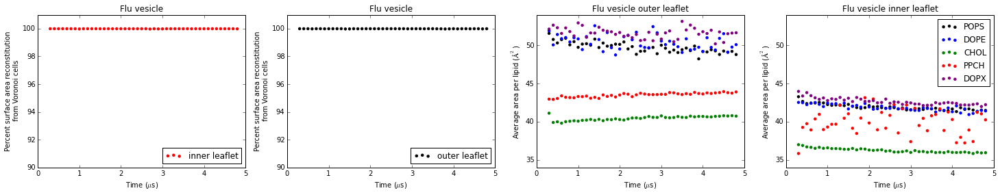

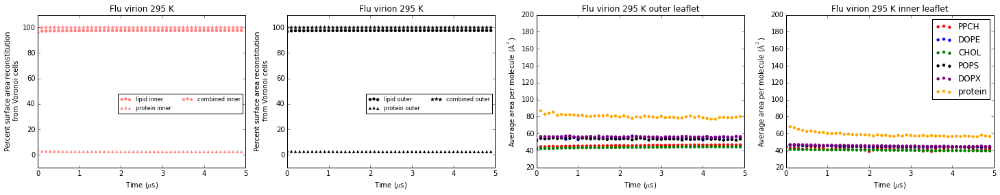

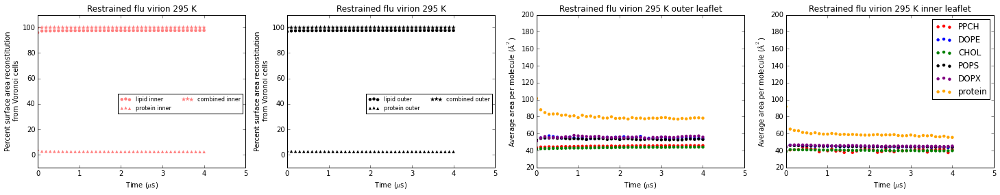

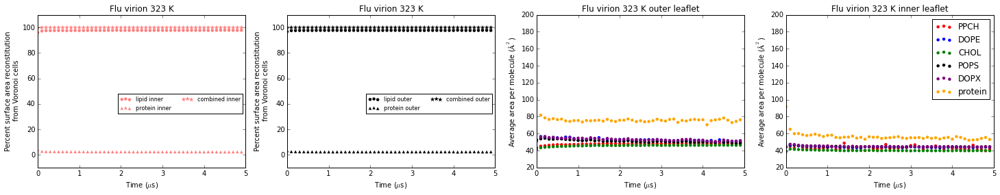

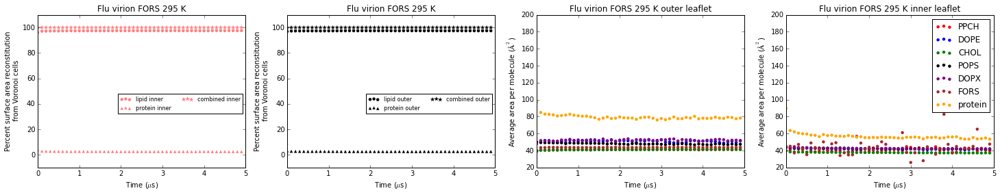

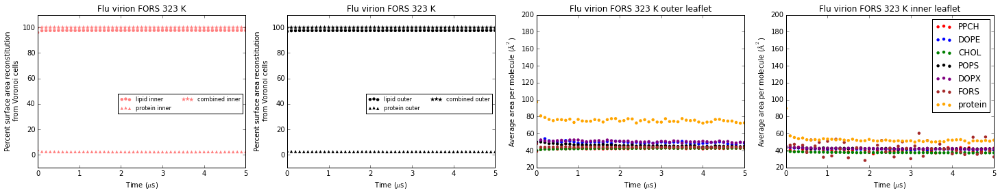

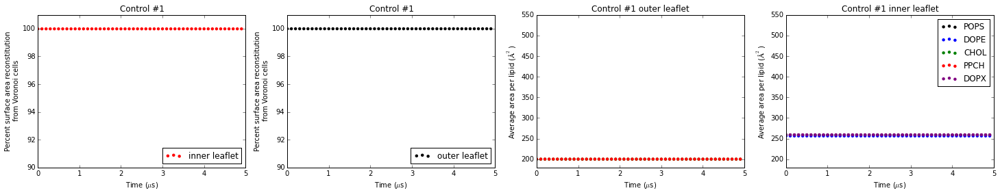

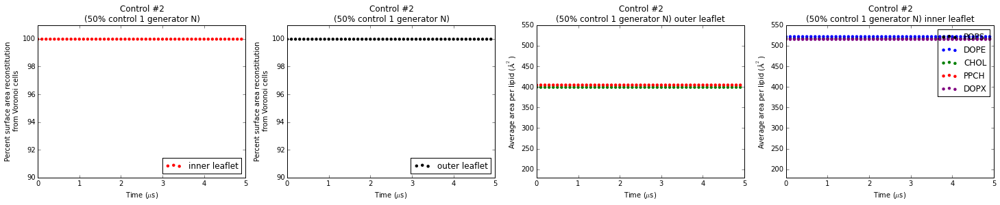

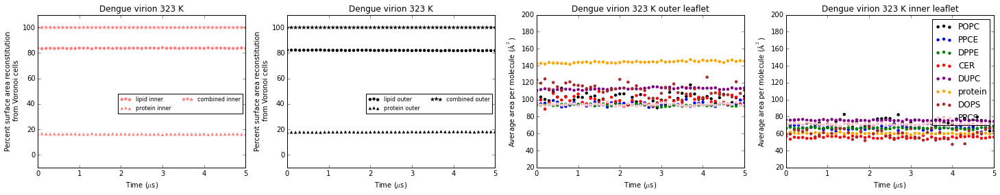

In [916]:
#start plotting test vesicle outer leaflet voronoi analysis results from above (now working to add inner leaflet results as well)
#now working to add plots for preliminary sim35 Voronoi parsing results

#plot sim33 area per molecule results:
fig2 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig2,list_frame_numbers=sim33_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=sim33_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=sim33_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Flu vesicle',dictionary_headgroup_data=sim33_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None)
#plot sim35 area per molecule results:
fig3 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig3,list_frame_numbers=sim35_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion 295 K',dictionary_headgroup_data=sim35_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim35_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim35_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim36 area per molecule results:
fig4 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig4,list_frame_numbers=sim36_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Restrained flu virion 295 K',dictionary_headgroup_data=sim36_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim36_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim36_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim37 area per molecule results:
fig5 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig5,list_frame_numbers=sim37_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion 323 K',dictionary_headgroup_data=sim37_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim37_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim37_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim38 area per molecule results:
fig6 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig6,list_frame_numbers=sim38_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion FORS 295 K',dictionary_headgroup_data=sim38_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim38_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim38_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim39 area per molecule results:
fig7 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig7,list_frame_numbers=sim39_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion FORS 323 K',dictionary_headgroup_data=sim39_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim39_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim39_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot control #1 area per molecule results:
fig8 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig8,list_frame_numbers=control_1_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=control_1_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=control_1_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Control #1',dictionary_headgroup_data=control_1_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None,control_condition=1)
#plot control #2 area per molecule results:
fig9 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig9,list_frame_numbers=control_2_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=control_2_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=control_2_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Control #2\n(50% control 1 generator N)',dictionary_headgroup_data=control_2_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None,control_condition=1)
#plot dengue area per molecule results:
fig10 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig10,list_frame_numbers=dengue_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Dengue virion 323 K',dictionary_headgroup_data=dengue_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=dengue_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=dengue_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_condition=1)

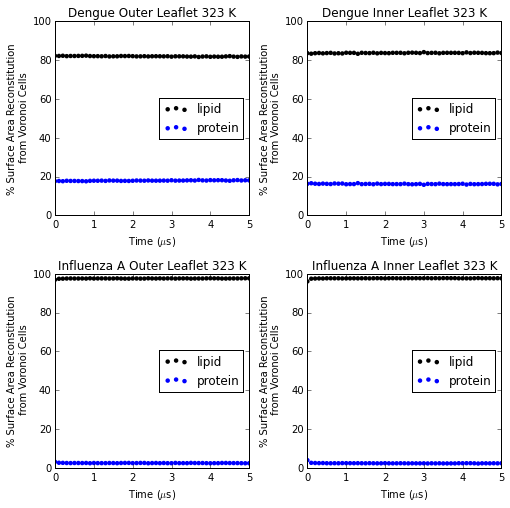

In [917]:
#rough work to update Figure S4 for dengue manuscript:

figure_S4_dengue_paper = plt.figure()

ax = figure_S4_dengue_paper.add_subplot(2,2,1)
dengue_time_array = numpy.arange(len(dengue_list_percent_surface_area_reconstitution_from_lipids_only)) / 10.
ax.scatter(dengue_time_array,dengue_list_percent_surface_area_reconstitution_from_lipids_only,c = 'k', label = 'lipid',edgecolor='none')
ax.scatter(dengue_time_array,dengue_list_percent_surface_area_reconstitution_from_proteins_only,c = 'blue', label = 'protein',edgecolor='none')
ax.set_title('Dengue Outer Leaflet 323 K')
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('% Surface Area Reconstitution\n from Voronoi Cells')
ax.set_ylim(0,100)
ax.legend(loc = 7)
ax.set_xlim(0,5)

ax2 = figure_S4_dengue_paper.add_subplot(2,2,2)
ax2.scatter(dengue_time_array,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,c = 'k', label = 'lipid',edgecolor='none')
ax2.scatter(dengue_time_array,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,c = 'blue', label = 'protein',edgecolor='none')
ax2.set_title('Dengue Inner Leaflet 323 K')
ax2.set_xlabel('Time ($\mu$s)')
ax2.set_ylabel('% Surface Area Reconstitution\n from Voronoi Cells')
ax2.set_ylim(0,100)
ax2.legend(loc = 7)
ax2.set_xlim(0,5)

ax3 = figure_S4_dengue_paper.add_subplot(2,2,3)
flu_time_array = numpy.arange(len(sim39_list_percent_surface_area_reconstitution_from_lipids_only)) / 10.
ax3.scatter(flu_time_array, sim39_list_percent_surface_area_reconstitution_from_lipids_only, c = 'k', label = 'lipid',edgecolor='none')
ax3.scatter(flu_time_array, sim39_list_percent_surface_area_reconstitution_from_proteins_only, c = 'blue', label = 'protein',edgecolor='none')
ax3.set_title('Influenza A Outer Leaflet 323 K')
ax3.set_xlabel('Time ($\mu$s)')
ax3.set_ylabel('% Surface Area Reconstitution\n from Voronoi Cells')
ax3.set_ylim(0,100)
ax3.legend(loc = 7)
ax3.set_xlim(0,5)

ax4 = figure_S4_dengue_paper.add_subplot(2,2,4)
ax4.scatter(flu_time_array, sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet, c = 'k', label = 'lipid',edgecolor='none')
ax4.scatter(flu_time_array, sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet, c = 'blue', label = 'protein',edgecolor='none')
ax4.set_title('Influenza A Inner Leaflet 323 K')
ax4.set_xlabel('Time ($\mu$s)')
ax4.set_ylabel('% Surface Area Reconstitution\n from Voronoi Cells')
ax4.set_ylim(0,100)
ax4.legend(loc = 7)
ax4.set_xlim(0,5)

figure_S4_dengue_paper.subplots_adjust(wspace = 0.3, hspace = 0.3)
figure_S4_dengue_paper.set_size_inches(8,8)
figure_S4_dengue_paper.savefig('Figure_S4.png', dpi = 300)

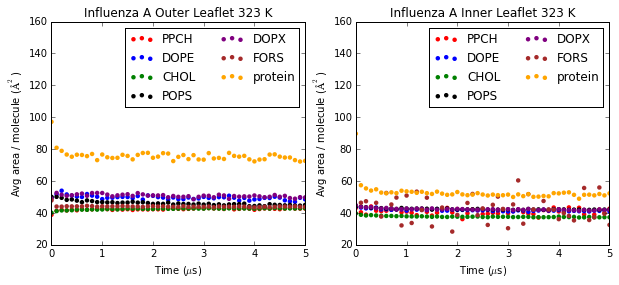

In [918]:
#rough work to produce Figure S5 for dengue manuscript

figure_S5_dengue_paper = plt.figure()

color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
#array_time_values = numpy.array(list_frame_numbers) / 10000. #microseconds

ax = figure_S5_dengue_paper.add_subplot('121')
for residue_name, subdictionary in sim39_dictionary_headgroup_data.iteritems():
    color = color_dict[residue_name]
    array_voronoi_cell_areas = numpy.array(subdictionary['voronoi_cell_avg_values_list'])
    array_time_values = numpy.arange(len(array_voronoi_cell_areas)) / 10.
    ax.scatter(array_time_values,array_voronoi_cell_areas,label=residue_name,edgecolor='None',color=color)
    
ax.legend(loc=1,ncol=2)
ax.set_ylabel('Avg area / molecule ($\AA^2$)')
ax.set_xlim(0,5)
ax.set_xlabel('Time ($\mu$s)')
ax.set_title('Influenza A Outer Leaflet 323 K')
ax.set_ylim(20,160)

ax2 = figure_S5_dengue_paper.add_subplot('122')
for residue_name, subdictionary in sim39_dictionary_headgroup_data.iteritems():
    color = color_dict[residue_name]
    array_voronoi_cell_areas = numpy.array(subdictionary['voronoi_cell_avg_values_list_inner_leaflet'])
    array_time_values = numpy.arange(len(array_voronoi_cell_areas)) / 10.
    ax2.scatter(array_time_values,array_voronoi_cell_areas,label=residue_name,edgecolor='None',color=color)

ax2.legend(loc=1,ncol=2)
ax2.set_ylabel('Avg area / molecule ($\AA^2$)')
ax2.set_xlim(0,5)
ax2.set_xlabel('Time ($\mu$s)')
ax2.set_title('Influenza A Inner Leaflet 323 K')
ax2.set_ylim(20,160)

figure_S5_dengue_paper.set_size_inches(10,4)
figure_S5_dengue_paper.savefig('Figure_S5.png', dpi = 300)

***Update:*** properly splitting the flu proteins into individual TMDs for the purpose of the Voronoi diagrams does not seem to substantially close the gap with dengue (i.e., a substantially higher percentage of the dengue surface area is accounted for by protein TMDs compared to influenza A)

The above plots are a good start for the flu vesicle outer leaflet voronoi parsing. The area per molecule values look more reasonable now. For example, previous DPD simulations for CHOL gave an area of 40.3 A$^2$ (de Meyer and Smit, 2009), and previous monolayer experiments produced an area of 41 A$^2$ for CHOL (Brzozowska and Figaszewski, 2002). Note that the area per molecule plot isn't currently displaying the standard deviations values, which are very large. That might be something to investigate.

The flu vesicle inner leaflet results are now included as well. As with the outer leaflet, the % surface area reconstitution from the Voronoi cells is excellent. The area per molecule for the inner leaflet shows evidence of really tight packing -- CHOL is well below the usual ~40 A$^2$ value, and all lipids seem to be dipping to tighter packing over the course of the 5 $\mu$s simulation. While one might argue that this is evidence that the system has not equilibrated, there is little we can do about this because of the computational cost of the simulations (and most biophysical parameters did appear to be stable). As with the outer leaflet, it will likely eventually be of interest to investigate the standard deviation of the area per molecule values. Finally, I will probably want to firmly establish the basis of the large fluctuations for inner leaflet PPCH -- my suspicion is that this is simply the result of an extremely low PPCH population in this leaflet. 

time to produce plots: 50.4490307371 minutes


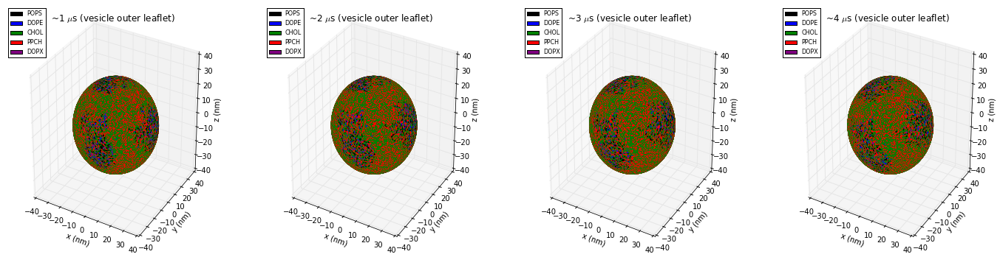

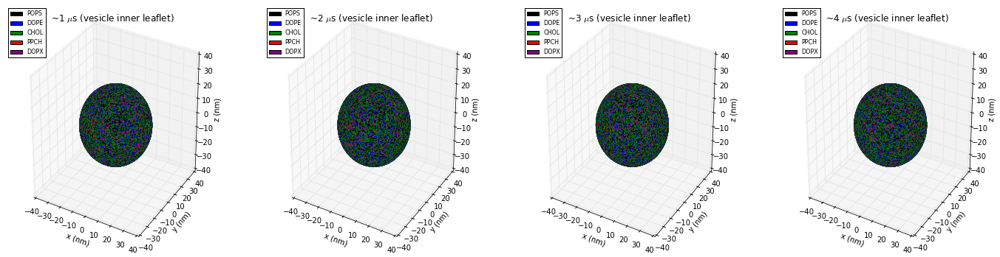

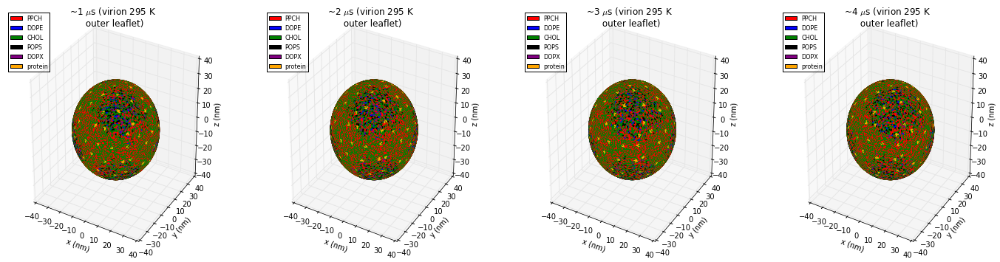

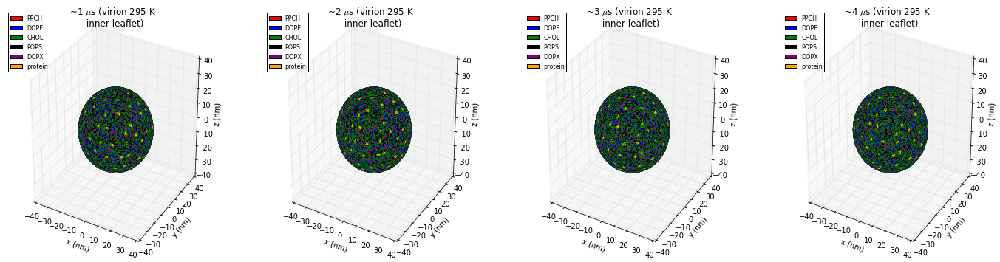

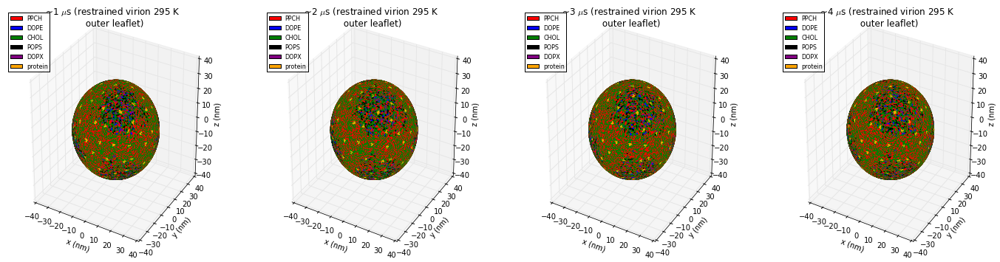

...

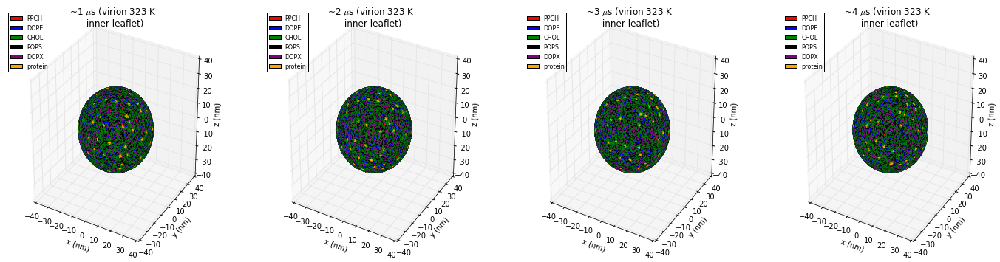

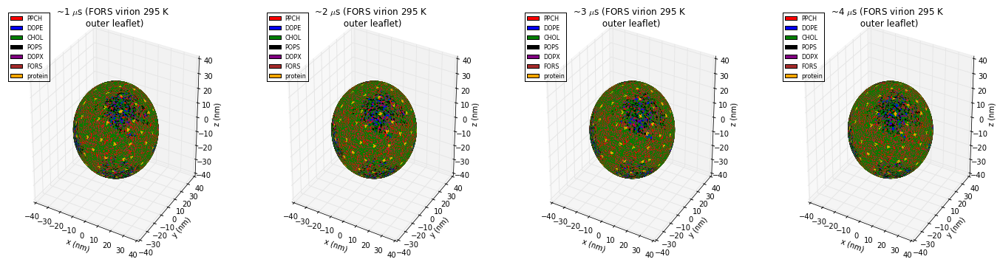

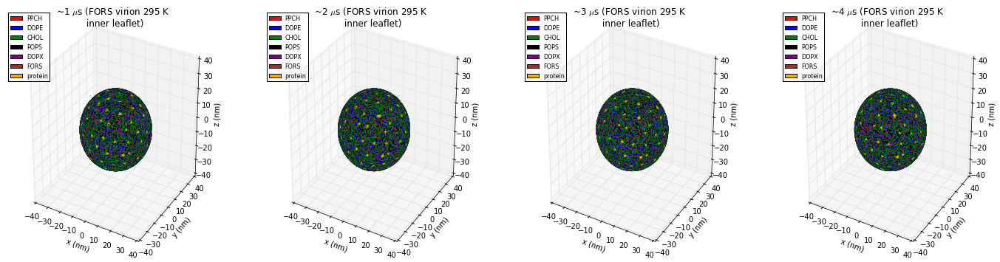

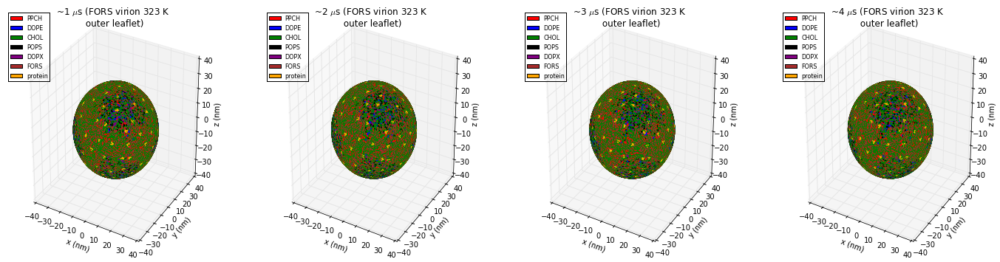

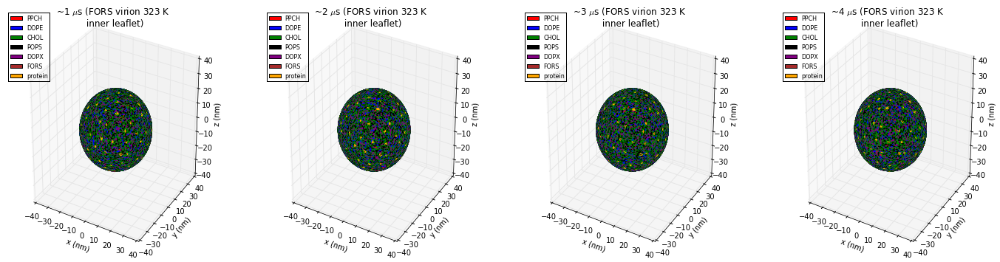

In [919]:
#now for sample spherical Voronoi diagrams for flu vesicle outer leaflet parsing (now working to include inner leaflet as well)
import time
start_time = time.time()

#flu vesicle outer leaflet:
fig3 = plt.figure()
list_voronoi_indices = [7,17,27,37] #start ~ 1 microsecond and work toward ~4 microseconds by skipping 10 indices each time (note that the index values are sensitive to the coarseness of the data parsing prior to this code)
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig3,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','vesicle outer leaflet',sim33_dictionary_headgroup_data)

#flu vesicle inner leaflet:
fig4 = plt.figure()
list_voronoi_indices = [7,17,27,37] #start ~ 1 microsecond and work toward ~4 microseconds by skipping 10 indices each time (note that the index values are sensitive to the coarseness of the data parsing prior to this code)
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig4,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','vesicle inner leaflet',sim33_dictionary_headgroup_data)

#sim35 outer leaflet
fig5 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig5,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 295 K\n outer leaflet',sim35_dictionary_headgroup_data)

#sim35 inner leaflet
fig6 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig6,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 295 K\n inner leaflet',sim35_dictionary_headgroup_data)

#sim36 outer leaflet
fig_sim36_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] #sim36 is shorter so maybe have to be careful here
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim36_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','restrained virion 295 K\n outer leaflet',sim36_dictionary_headgroup_data)

#sim36 inner leaflet
fig_sim36_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim36_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','restrained virion 295 K\n inner leaflet',sim36_dictionary_headgroup_data)

#sim37 outer leaflet
fig_sim37_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim37_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 323 K\n outer leaflet',sim37_dictionary_headgroup_data)

#sim37 inner leaflet
fig_sim37_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim37_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 323 K\n inner leaflet',sim37_dictionary_headgroup_data)

#sim38 outer leaflet
fig_sim38_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim38_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 295 K\n outer leaflet',sim38_dictionary_headgroup_data)

#sim38 inner leaflet
fig_sim38_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim38_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 295 K\n inner leaflet',sim38_dictionary_headgroup_data)

#sim39 outer leaflet
fig_sim39_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim39_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 323 K\n outer leaflet',sim39_dictionary_headgroup_data)

#sim39 inner leaflet
fig_sim39_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim39_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 323 K\n inner leaflet',sim39_dictionary_headgroup_data)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

time to produce plots: 1.12840330203 minutes


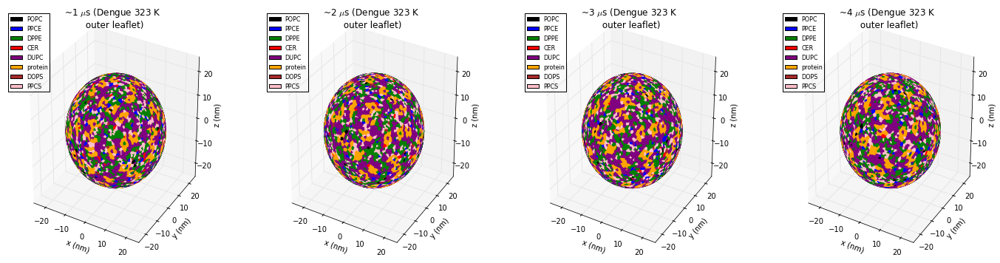

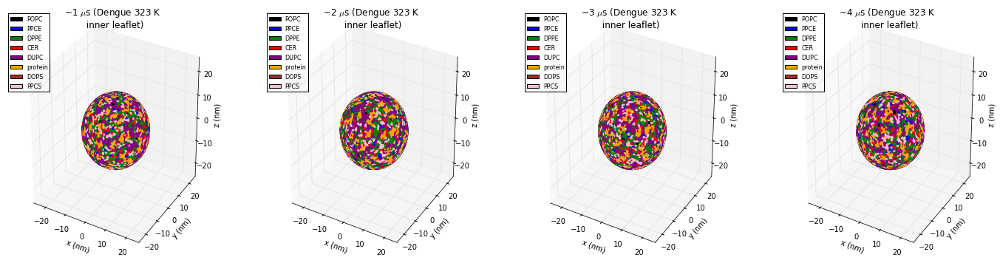

In [920]:
#dengue Voronoi plots (testing phase)
import time #takes a long time to generate these plots -- quantify this while I'm testing dengue plots
start_time = time.time()

fig_dengue_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_dengue_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Dengue 323 K\n outer leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

fig_dengue_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_dengue_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Dengue 323 K\n inner leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

time to produce plots: 11.6646740834 minutes


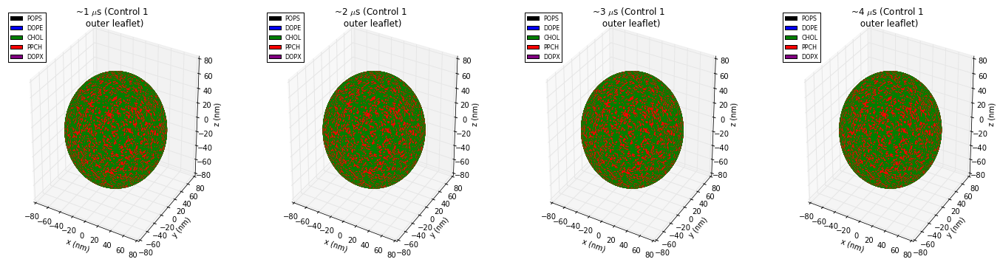

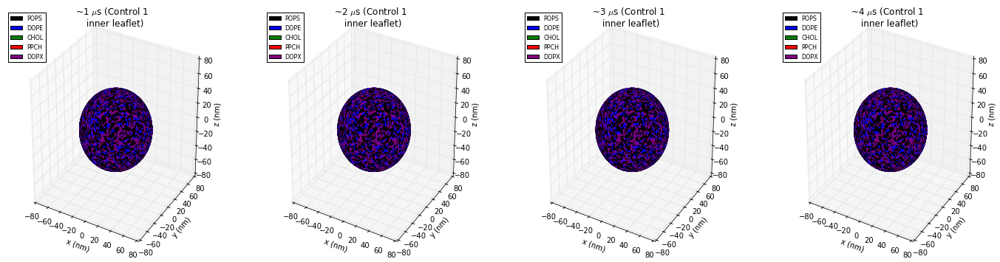

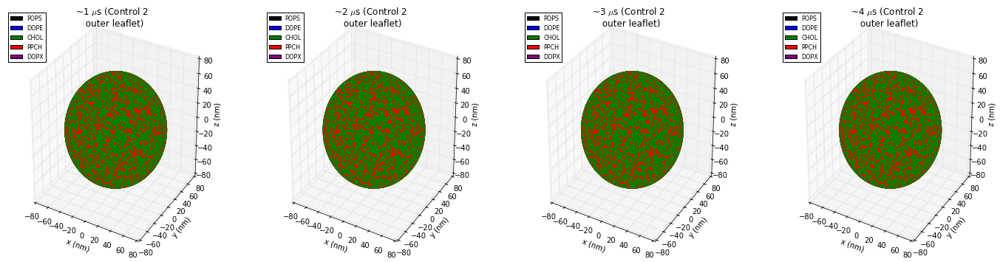

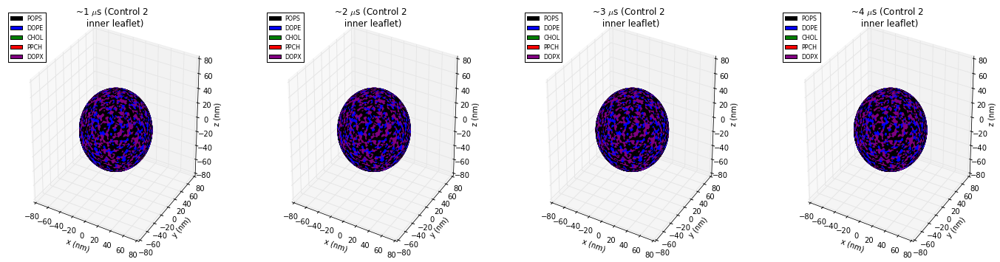

In [921]:
#control Voronoi plots:
import time 
start_time = time.time()

fig_control_1_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_control_1_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 1 \n outer leaflet',control_1_dictionary_headgroup_data,control_condition=1)

fig_control_1_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_control_1_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 1 \n inner leaflet',control_1_dictionary_headgroup_data,control_condition=1)

fig_control_2_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_control_2_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 2 \n outer leaflet',control_2_dictionary_headgroup_data,control_condition=1)

fig_control_2_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_control_2_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 2 \n inner leaflet',control_2_dictionary_headgroup_data,control_condition=1)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

The Voronoi diagrams from the flu vesicle simulation (outer leaflet) look quite sensible. CHOL and PPCH dominate, as expected. The domain segregation is almost certainly the result of the inner leaflet species involuting to the outer leaflet during equilibration / hole closure. By visual inspection, it is actually rather difficult to find any differences between these diagrams from different time points. This is also not particularly surprising given the extremely high CHOL concentration and the extremely slow diffusion of the lipid species.

The next logical step will probably be to extend the analysis workflow above to include the flu vesicle *inner* leaflet.

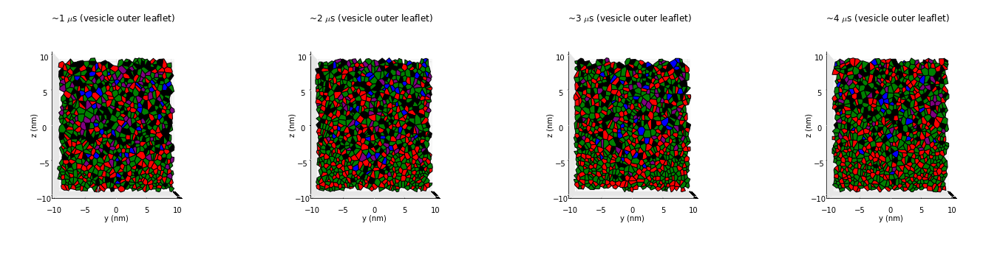

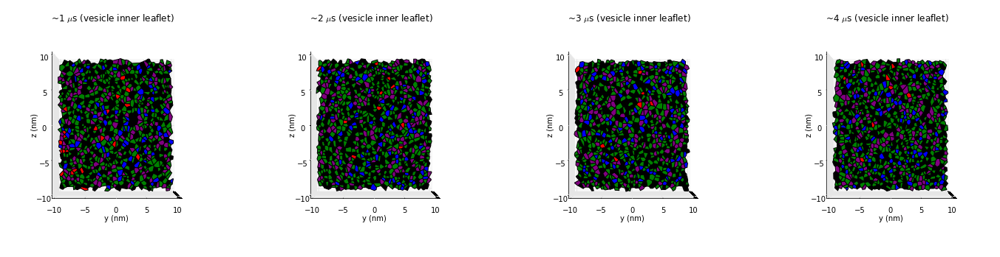

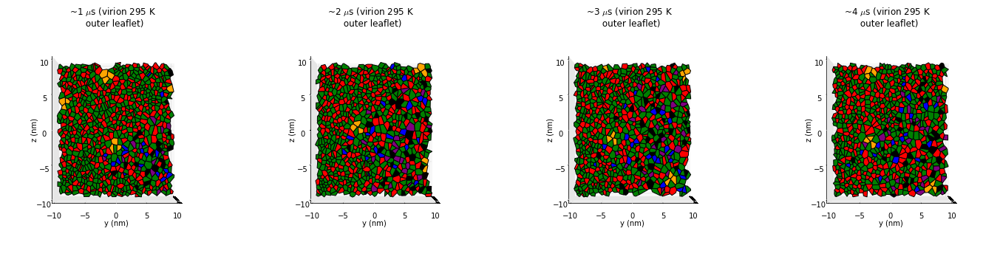

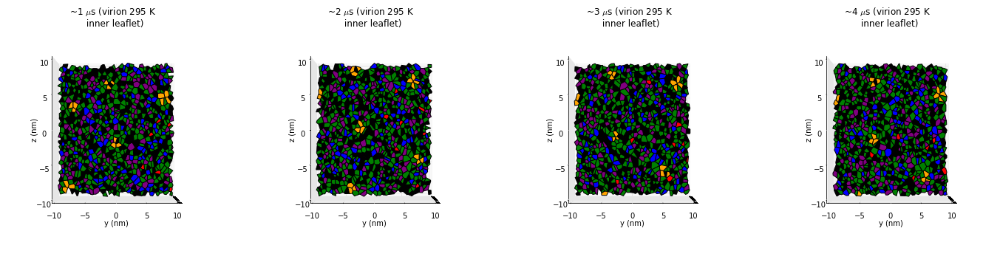

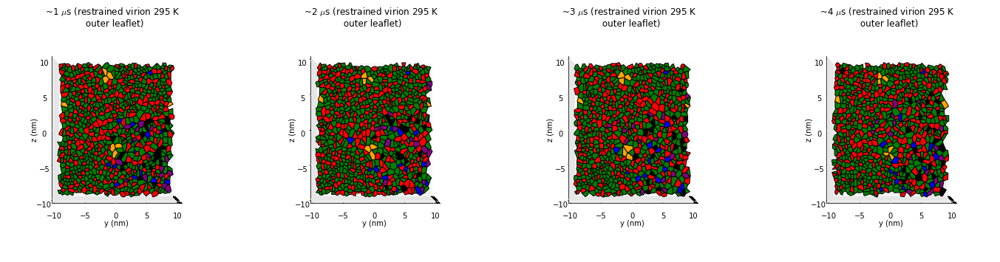

...

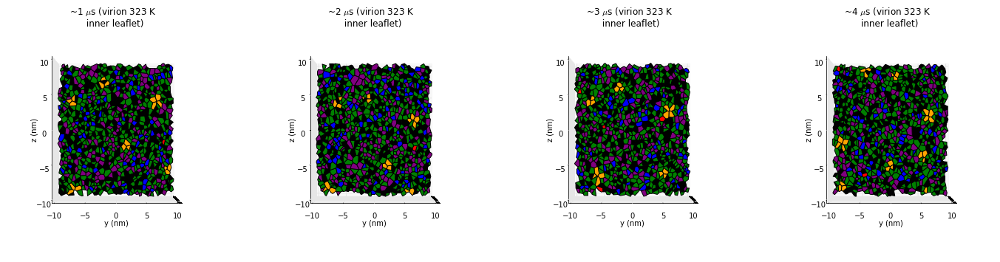

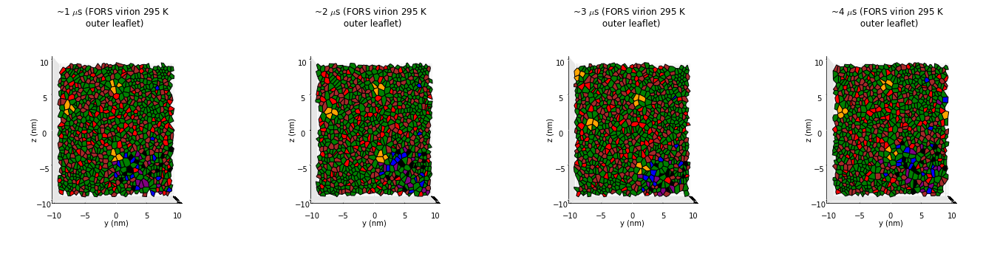

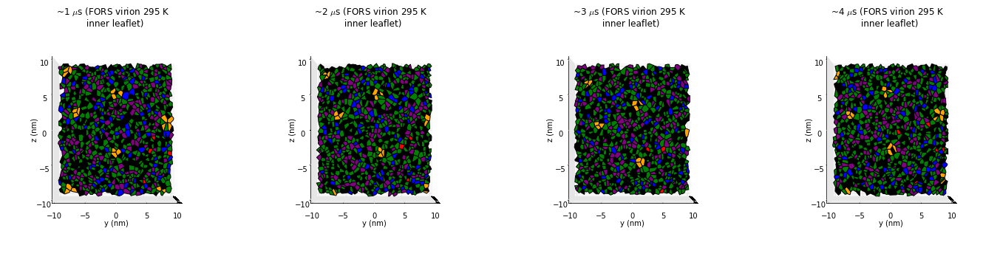

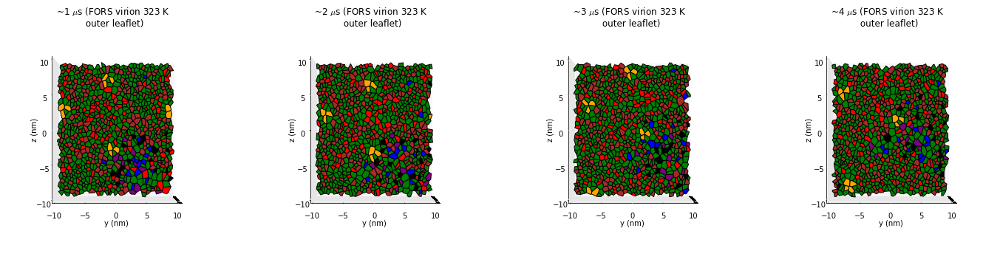

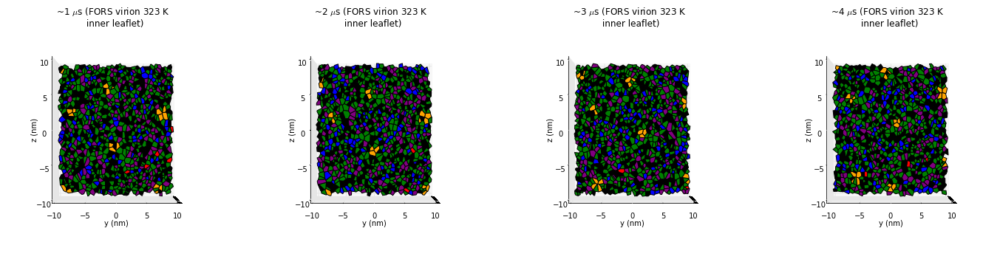

In [922]:
#plot matching zoom-in views of Voronoi diagrams (so Voronoi cells can be seen more clearly)
#sim33 outer leaflet:
fig7 = plt.figure()
list_voronoi_indices = [7,17,27,37] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig7,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','vesicle outer leaflet',sim33_dictionary_headgroup_data)
#sim33 inner leaflet:
fig8 = plt.figure()
list_voronoi_indices = [7,17,27,37] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig8,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','vesicle inner leaflet',sim33_dictionary_headgroup_data)
#sim35 outer leaflet:
fig9 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig9,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 295 K\n outer leaflet',sim35_dictionary_headgroup_data)
#sim35 inner leaflet:
fig10 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig10,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 295 K\n inner leaflet',sim35_dictionary_headgroup_data)

#sim36 outer leaflet:
fig_sim36_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim36_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','restrained virion 295 K\n outer leaflet',sim36_dictionary_headgroup_data)
#sim36 inner leaflet:
fig_sim36_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim36_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','restrained virion 295 K\n inner leaflet',sim36_dictionary_headgroup_data)

#sim37 outer leaflet:
fig_sim37_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim37_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 323 K\n outer leaflet',sim37_dictionary_headgroup_data)
#sim37 inner leaflet:
fig_sim37_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim37_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 323 K\n inner leaflet',sim37_dictionary_headgroup_data)

#sim38 outer leaflet:
fig_sim38_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim38_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 295 K\n outer leaflet',sim38_dictionary_headgroup_data)
#sim38 inner leaflet:
fig_sim38_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim38_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 295 K\n inner leaflet',sim38_dictionary_headgroup_data)

#sim39 outer leaflet:
fig_sim39_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim39_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 323 K\n outer leaflet',sim39_dictionary_headgroup_data)
#sim39 inner leaflet:
fig_sim39_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim39_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 323 K\n inner leaflet',sim39_dictionary_headgroup_data)

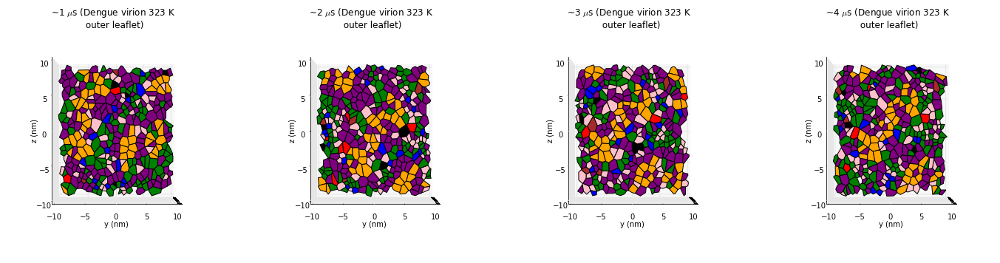

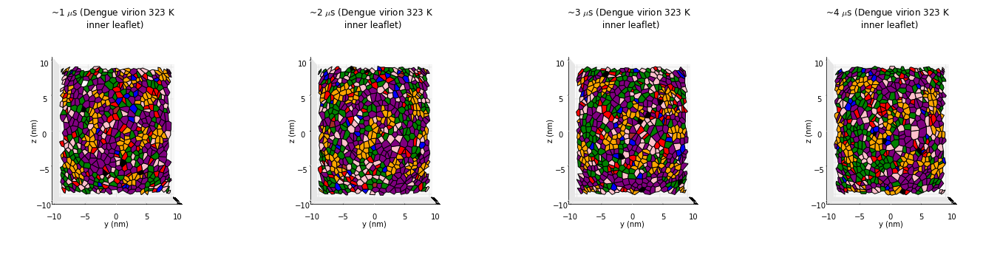

In [923]:
#test zoom plots for dengue condition:

#dengue outer leaflet:
fig_dengue_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_dengue_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Dengue virion 323 K\n outer leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

#dengue inner leaflet:
fig_dengue_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_dengue_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Dengue virion 323 K\n inner leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)


In [147]:
control_1_generators = engine_control_1['generator_coords_control_1']
control_2_generators = engine_control_2['generator_coords_control_2']
(control_1_generators.shape,control_2_generators.shape)

((42912, 3), (21454, 3))

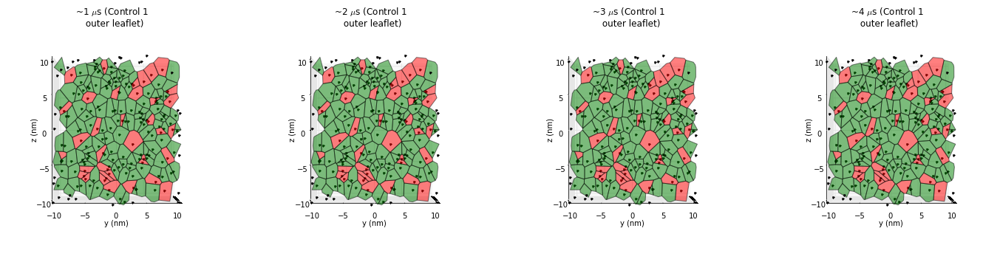

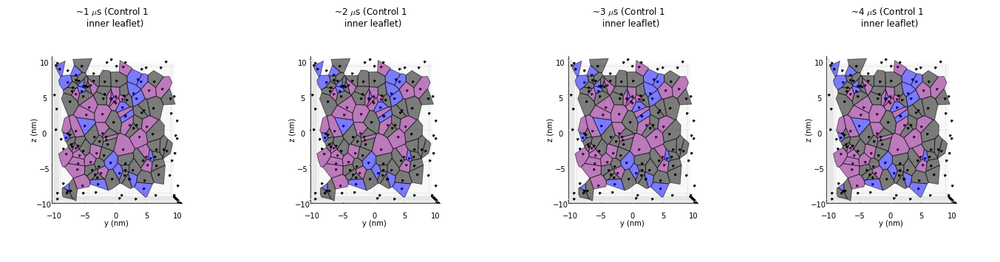

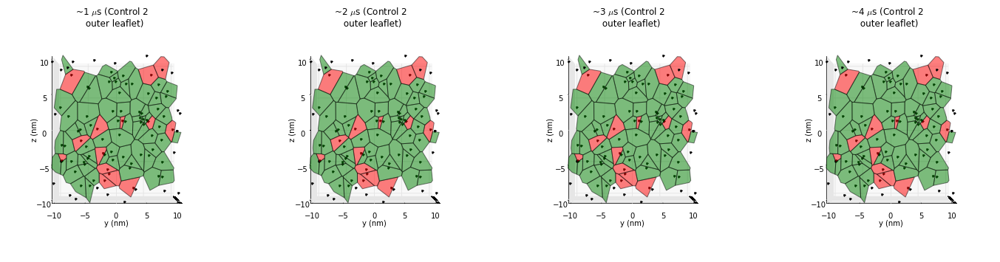

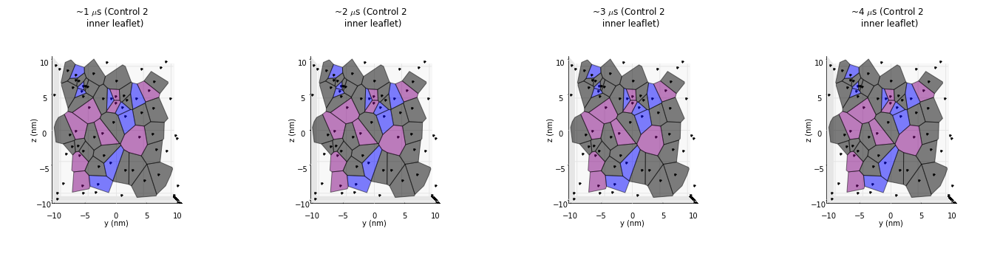

In [924]:
#test zoom plots for control conditions:
#debug blank spaces by plotting generators for these control zoom-in plots

fig_control_1_outer_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_control_1_outer_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 1 \n outer leaflet',control_1_dictionary_headgroup_data,None,1,control_1_generators)

fig_control_1_inner_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_control_1_inner_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 1 \n inner leaflet',control_1_dictionary_headgroup_data,None,1,control_1_generators)

fig_control_2_outer_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_control_2_outer_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 2 \n outer leaflet',control_2_dictionary_headgroup_data,None,1,control_2_generators)

fig_control_2_inner_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_control_2_inner_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 2 \n inner leaflet',control_2_dictionary_headgroup_data,None,1,control_2_generators)


In [933]:
#rough work to test new neighbour analysis class object I've been drafting
dengue_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(dengue_dictionary_headgroup_data)

In [934]:
%%time
inner_leaflet_neighbour_dict_testing, outer_leaflet_neighbour_dict_testing = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 0) #this runs really slowly at the moment -- about 36 minutes for a single frame on hpslu; 14 minutes on rMBP;

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [935]:
#if the above testing work runs without an exception, reassign the dictionary values used for plotting assessment below:
inner_leaflet_neighbour_dict, outer_leaflet_neighbour_dict = (inner_leaflet_neighbour_dict_testing, outer_leaflet_neighbour_dict_testing)

In [936]:
%%time
#try expanding dengue raw neighbour analysis beyond the first frame
dengue_inner_leaflet_neighbour_dict_1_us, dengue_outer_leaflet_neighbour_dict_1_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 10) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [937]:
%%time
#dengue raw neighbour analysis at 2 microseconds
dengue_inner_leaflet_neighbour_dict_2_us, dengue_outer_leaflet_neighbour_dict_2_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 20) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [938]:
%%time
#dengue raw neighbour analysis at 3 microseconds
dengue_inner_leaflet_neighbour_dict_3_us, dengue_outer_leaflet_neighbour_dict_3_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 30) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [939]:
%%time
#dengue raw neighbour analysis at 4 microseconds
dengue_inner_leaflet_neighbour_dict_4_us, dengue_outer_leaflet_neighbour_dict_4_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 40) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [940]:
%%time
#dengue raw neighbour analysis at 5 microseconds
dengue_inner_leaflet_neighbour_dict_5_us, dengue_outer_leaflet_neighbour_dict_5_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 50) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [957]:
#debug faulty PPCS count issue
PPCS_counter = 0
for neighbour_count, subdict in inner_leaflet_neighbour_dict['PPCS'].iteritems():
    #print 'neighbour_count:', neighbour_count, 'subdict.keys():', subdict.keys()
    #print 'frequency:', subdict['frequency']
    PPCS_counter += subdict['frequency']
    
for neighbour_count, subdict in outer_leaflet_neighbour_dict['PPCS'].iteritems():
    PPCS_counter += subdict['frequency']
print 'PPCS_counter:', PPCS_counter
    
#dengue_inner_leaflet_neighbour_dict_5_us['PPCS'].keys()

PPCS_counter: 1465


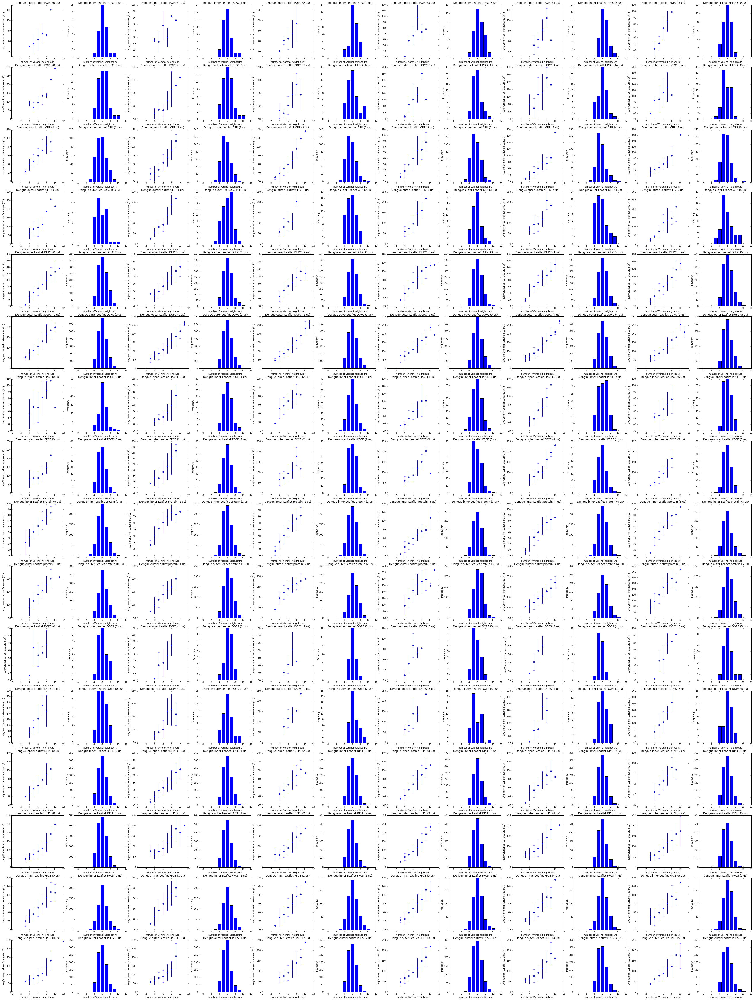

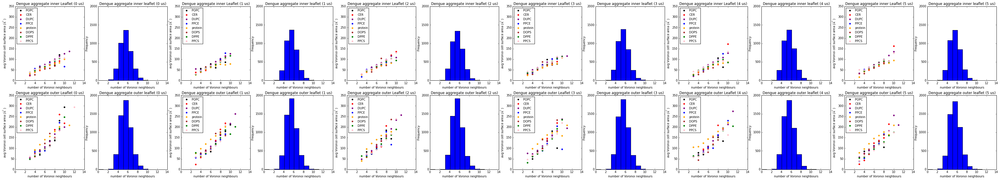

In [958]:
molecular_species_count_dictionary = {'POPC': 77, 'PPCE': 319, 'DPPE': 2412, 'CER': 420, 'DUPC': 3117, 'DOPS': 63, 'PPCS': 1465, 'protein': 720 * 2} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
#unresolved issue: there should be 1467 PPCS counts, but I recently had to adjust to 1465 to satisfy the workflow -- what is going on here???
color_dict = {'POPC':'black','PPCE':'blue','DPPE':'green','CER':'red','DUPC':'purple','protein':'orange','DOPS':'brown','PPCS':'pink'}

fig_testing_neighbour_results_dengue = plt.figure()
fig_testing_neighbour_aggregate_results_dengue = plt.figure()
dengue_raw_voronoi_analysis_plotting_instance = voronoi_analysis_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_dengue, inner_leaflet_neighbour_dict, outer_leaflet_neighbour_dict)
dengue_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'Dengue', fig_testing_neighbour_aggregate_results_dengue, color_dict, 60, 80, [dengue_inner_leaflet_neighbour_dict_1_us,dengue_inner_leaflet_neighbour_dict_2_us,dengue_inner_leaflet_neighbour_dict_3_us,dengue_inner_leaflet_neighbour_dict_4_us,dengue_inner_leaflet_neighbour_dict_5_us], [dengue_outer_leaflet_neighbour_dict_1_us,dengue_outer_leaflet_neighbour_dict_2_us,dengue_outer_leaflet_neighbour_dict_3_us,dengue_outer_leaflet_neighbour_dict_4_us,dengue_outer_leaflet_neighbour_dict_5_us], ['0 us', '1 us','2 us','3 us','4 us','5 us'])
fig_testing_neighbour_results_dengue.savefig('raw_neighbour_voronoi_results_dengue.png', dpi = 300)
fig_testing_neighbour_aggregate_results_dengue.savefig('aggregate_raw_neighbour_voronoi_results_dengue.png', dpi = 300)

In [964]:
#testing species-based neighbour analysis work
dengue_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(dengue_dictionary_headgroup_data)


In [1006]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_0us, outer_leaflet_dengue_neighbour_dict_species_specific_0us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 36min 49s, sys: 15.4 s, total: 37min 5s
Wall time: 36min 52s


In [1007]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_1us, outer_leaflet_dengue_neighbour_dict_species_specific_1us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 10) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 36min 54s, sys: 25.5 s, total: 37min 19s
Wall time: 36min 56s


In [1014]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_2us, outer_leaflet_dengue_neighbour_dict_species_specific_2us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 20) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 36min 43s, sys: 15.7 s, total: 36min 59s
Wall time: 36min 45s


In [ ]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_3us, outer_leaflet_dengue_neighbour_dict_species_specific_3us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 30) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE

In [1016]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_4us, outer_leaflet_dengue_neighbour_dict_species_specific_4us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 40) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 37min 1s, sys: 16 s, total: 37min 17s
Wall time: 37min 2s


In [ ]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_5us, outer_leaflet_dengue_neighbour_dict_species_specific_5us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 50) 


POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS

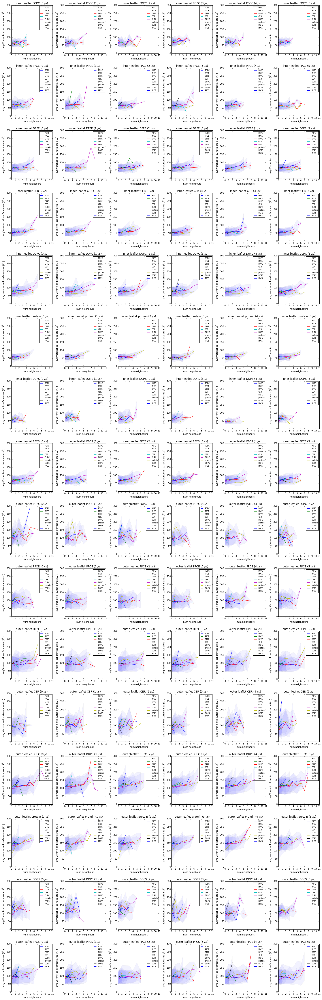

In [1025]:
#rough work to produce initial plots for neighbour species-based analysis
fig_neighbour_species_dengue = plt.figure()
dengue_neighbour_species_plot_instance = voronoi_analysis_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_dengue, inner_leaflet_dengue_neighbour_dict_species_specific_0us, outer_leaflet_dengue_neighbour_dict_species_specific_0us)
dengue_neighbour_species_plot_instance.plot(num_lipid_species = 8, timestamp_list_microseconds = [0, 1, 2, 3, 4, 5], list_additional_inner_leaflet_dicts = [inner_leaflet_dengue_neighbour_dict_species_specific_1us, inner_leaflet_dengue_neighbour_dict_species_specific_2us, inner_leaflet_dengue_neighbour_dict_species_specific_3us, inner_leaflet_dengue_neighbour_dict_species_specific_4us, inner_leaflet_dengue_neighbour_dict_species_specific_5us], list_additional_outer_leaflet_dicts = [outer_leaflet_dengue_neighbour_dict_species_specific_1us, outer_leaflet_dengue_neighbour_dict_species_specific_2us, outer_leaflet_dengue_neighbour_dict_species_specific_3us, outer_leaflet_dengue_neighbour_dict_species_specific_4us, outer_leaflet_dengue_neighbour_dict_species_specific_5us], area_range = (0, 300))

In [1036]:
%load_ext line_profiler

In [1177]:
#rough work to optimize  voronoi_neighbour_analysis.identify_voronoi_neighbours() so that it can be used more practically with flu simulations (running far too slowly at the moment); will probably have to benchmark with dengue data initially because flu takes too long; should institute a crude unit test to check a portion of the results to insulate against introducing problems while benchmarking / optimizing
reload(voronoi_analysis_library)
#benchmark using dengue raw neighbour analysis at 5 microseconds
%lprun -f voronoi_analysis_library.voronoi_neighbour_analysis.per_leaflet_accumulation_neighbour_data -f voronoi_analysis_library.voronoi_neighbour_analysis.condense_voronoi_cell_data_by_leaflet -f voronoi_analysis_library.voronoi_neighbour_analysis.count_neighbours_current_frame -T profiling.txt dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 50) 
#%lprun -f voronoi_analysis_library.voronoi_neighbour_analysis.identify_voronoi_neighbours -T profiling.txt dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 50) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [1115]:
#I need to focus the optimization on per_leaflet_accumulation_neighbour_data() method, where the vast majority of the time is spent


In [1176]:
#crude unit test to ensure that the data obtained is the same after optimization:
reload(voronoi_analysis_library)
dengue_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(dengue_dictionary_headgroup_data)
benchmark_dict_inner, benchmark_dict_outer = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 50) 
(benchmark_dict_inner, benchmark_dict_outer ) == (dengue_inner_leaflet_neighbour_dict_5_us, dengue_outer_leaflet_neighbour_dict_5_us)

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )


KeyboardInterrupt: 

In [1155]:
sim39_dictionary_headgroup_data.keys()

['PPCH', 'DOPE', 'CHOL', 'POPS', 'DOPX', 'FORS', 'protein']

In [1156]:
#for influenza (as for dengue), start off with analysis of the raw number of neighbours and work towards the neighbour species-specific type analysis
sim39_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(sim39_dictionary_headgroup_data)


In [ ]:
start_time = time.time()
sim39_inner_leaflet_neighbour_dict_0_us, sim39_outer_leaflet_neighbour_dict_0_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 0) #took 5 h 15 min on rMBP -- so the flu neighbour analyses are quite time consuming at the moment!
end_time = time.time()
total_time = end_time - start_time
total_time_minutes = total_time / 60.
total_time_hours = total_time_minutes / 60.
#takes 13 h 29 min on hpslu!!! ; now testing with new structured array / in1d workflow; now optimized to about 1 hour running time on hpslu

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH

In [1179]:
sim39_inner_leaflet_neighbour_dict_1_us, sim39_outer_leaflet_neighbour_dict_1_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 10) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results di

In [1183]:
sim39_inner_leaflet_neighbour_dict_2_us, sim39_outer_leaflet_neighbour_dict_2_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 20) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results di

In [1184]:
sim39_inner_leaflet_neighbour_dict_3_us, sim39_outer_leaflet_neighbour_dict_3_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 30) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results di

In [1185]:
sim39_inner_leaflet_neighbour_dict_4_us, sim39_outer_leaflet_neighbour_dict_4_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 40) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results di

In [1186]:
sim39_inner_leaflet_neighbour_dict_5_us, sim39_outer_leaflet_neighbour_dict_5_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 50) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results di

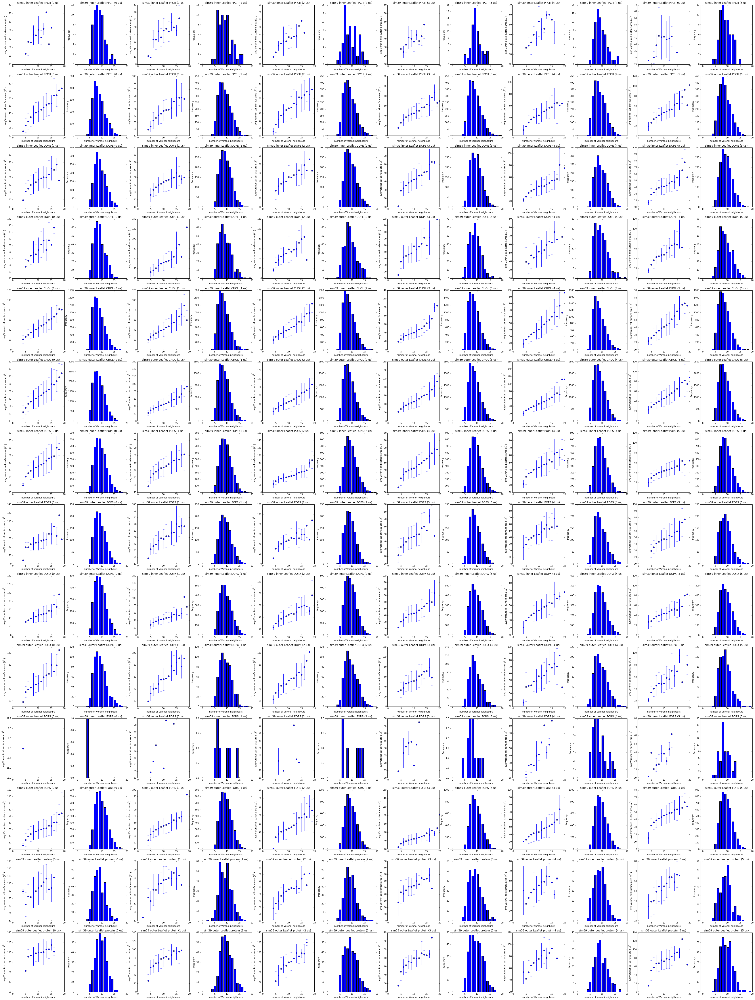

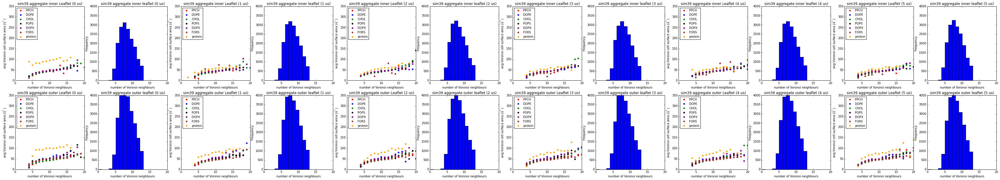

In [1189]:
#start modifying the dengue raw neighbour data plotting code to serve as the sim39 raw neighbour data plotting code:
color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
molecular_species_count_dictionary = {'POPS': 6288, 'DOPX': 3753, 'DOPE': 2111, 'CHOL': 22829, 'FORS':5337, 'PPCH': 2594, 'protein': 2 * (80 * 3 + 12 * 4 + 15 * 4) -2} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
#the -2 in the protein count above was added artificially -- see workflowy for my concerns about this


fig_testing_neighbour_results_sim39 = plt.figure()
fig_testing_neighbour_aggregate_results_sim39 = plt.figure()
sim39_raw_voronoi_analysis_plotting_instance = voronoi_analysis_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_sim39, sim39_inner_leaflet_neighbour_dict_0_us, sim39_outer_leaflet_neighbour_dict_0_us)
sim39_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'sim39', fig_testing_neighbour_aggregate_results_sim39, color_dict, 60, 80, [sim39_inner_leaflet_neighbour_dict_1_us,sim39_inner_leaflet_neighbour_dict_2_us,sim39_inner_leaflet_neighbour_dict_3_us,sim39_inner_leaflet_neighbour_dict_4_us,sim39_inner_leaflet_neighbour_dict_5_us], [sim39_outer_leaflet_neighbour_dict_1_us,sim39_outer_leaflet_neighbour_dict_2_us,sim39_outer_leaflet_neighbour_dict_3_us,sim39_outer_leaflet_neighbour_dict_4_us,sim39_outer_leaflet_neighbour_dict_5_us], ['0 us', '1 us','2 us','3 us','4 us','5 us'], general_plots_xmax = 20, aggregate_ymax = 4000)

In [122]:
#testing species-based neighbour analysis work for sim39 now
sim39_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(sim39_dictionary_headgroup_data)


In [123]:
sim39_inner_leaflet_neighbour_dict_testing_by_species, sim39_outer_leaflet_neighbour_dict_testing_by_species = sim39_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 


PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHOL ( voronoi_cell_list_vertex_arrays )
POPS ( voronoi_cell_list_vertex_arrays )
DOPX ( voronoi_cell_list_vertex_arrays )
FORS ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )


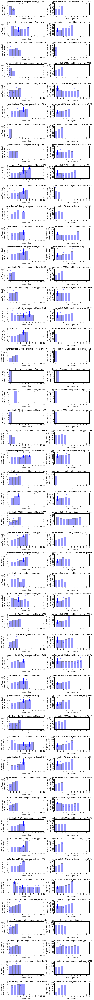

In [127]:
fig_neighbour_species_sim39 = plt.figure()

sim39_neighbour_species_plot_instance = voronoi_analysis_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_sim39, sim39_inner_leaflet_neighbour_dict_testing_by_species, sim39_outer_leaflet_neighbour_dict_testing_by_species)
sim39_neighbour_species_plot_instance.plot()